In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import functions as F
from pyspark.sql.functions import col, to_date, when, countDistinct, count
from pyspark.sql.functions import split, explode, trim, col, lit, length
from pyspark.sql.functions import current_date, row_number, regexp_replace, coalesce
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.window import Window
import numpy as np

In [0]:
display(dbutils.fs.ls("dbfs:/FileStore/tables/"))


path,name,size,modificationTime
dbfs:/FileStore/tables/2025_03_11___DBFS_Example_Classifier.ipynb,2025_03_11___DBFS_Example_Classifier.ipynb,68203,1742288094000
dbfs:/FileStore/tables/IMDB_Cleaned/,IMDB_Cleaned/,0,0
dbfs:/FileStore/tables/Imdb_Movie_Dataset-1.csv,Imdb_Movie_Dataset-1.csv,392283051,1746882391000
dbfs:/FileStore/tables/Imdb_Movie_Dataset.csv,Imdb_Movie_Dataset.csv,392283051,1746879701000
dbfs:/FileStore/tables/archive-1.zip,archive-1.zip,160786298,1746877527000
dbfs:/FileStore/tables/archive-2.zip,archive-2.zip,160786298,1746877987000
dbfs:/FileStore/tables/archive-3.zip,archive-3.zip,160786298,1746878808000
dbfs:/FileStore/tables/archive-4.zip,archive-4.zip,160786298,1746879282000
dbfs:/FileStore/tables/archive.zip,archive.zip,160786298,1746877512000
dbfs:/FileStore/tables/df_checkpoint/,df_checkpoint/,0,0


In [0]:
# File location and type
file_location = "/FileStore/tables/Imdb_Movie_Dataset-1.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
# quote <-- Important to handle commas correctly
df = (
    spark.read.format(file_type)
    .option("inferSchema", infer_schema)
    .option("header", first_row_is_header)
    .option("sep", delimiter)
    .option("quote", '"')
    .option("escape", '"')
    .load(file_location)
)

display(df)

id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
27205,Inception,8.364,34495,Released,7/15/2010,825532764,148,false,160000000,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: ""inception"", the implantation of another person's idea into a target's subconscious.",83.952,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pictures","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, france, virtual reality, kidnapping, philosophy, spy, allegory, manipulation, car crash, heist, memory, architecture, los angeles, california, dream world, subconscious"
157336,Interstellar,8.417,32571,Released,11/5/2014,701729206,169,false,165000000,tt0816692,en,Interstellar,The adventures of a group of explorers who make use of a newly discovered wormhole to surpass the limitations on human space travel and conquer the vast distances involved in an interstellar voyage.,140.241,Mankind was born on Earth. It was never meant to die here.,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Productions","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time, artificial intelligence (a.i.), nasa, time warp, dystopia, expedition, space travel, wormhole, famine, black hole, quantum mechanics, family relationships, space, robot, astronaut, scientist, single father, farmer, space station, curious, space adventure, time paradox, thoughtful, time-manipulation, father daughter relationship, 2060s, cornfield, time manipulation, complicated"
155,The Dark Knight,8.512,30619,Released,7/16/2008,1004558444,152,false,185000000,tt0468569,en,The Dark Knight,"Batman raises the stakes in his war on crime. With the help of Lt. Jim Gordon and District Attorney Harvey Dent, Batman sets out to dismantle the remaining criminal organizations that plague the streets. The partnership proves to be effective, but they soon find themselves prey to a reign of chaos unleashed by a rising criminal mastermind known to the terrified citizens of Gotham as the Joker.",130.643,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel Griffiths, Warner Bros. Pictures","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime fighter, superhero, anti hero, scarecrow, based on comic, vigilante, organized crime, tragic hero, anti villain, criminal mastermind, district attorney, super power, super villain, neo-noir"
19995,Avatar,7.573,29815,Released,12/15/2009,2923706026,162,false,237000000,tt0499549,en,Avatar,"In the 22nd century, a paraplegic Marine is dispatched to the moon Pandora on a unique mission, but becomes torn between following orders and protecting an alien civilization.",79.932,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, 20th Century Fox, Ingenious Media","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, space war, space colony, tribe, romance, alien, futuristic, space, alien planet, marine, soldier, battle, love affair, nature, anti war, power relations, joyful"
24428,The Avengers,7.71,29166,Released,4/25/2012,1518815515,143,false,220000000,tt0848228,en,The Avengers,"When an unexpected enemy emerges and threatens global safety and security, Nick Fury, director of the international peacekeeping agency known as S.H.I.E.L.D., finds himself in need of a team to pull the world back from the brink of disast

#Data Cleaning

Can we predict the box office revenue of a movie before it is released?
This project explores that question by building a machine learning regression model using Apache Spark MLlib to predict the revenue of a movie based on features such as budget, genre, popularity, vote average, and more.


In [0]:
df.printSchema()


root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: long (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: integer (nullable = true)
 |-- imdb_id: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- tagline: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: string (nullable = true)
 |-- production_countries: string (nullable = true)
 |-- spoken_languages: string (nullable = true)
 |-- keywords: string (nullable = true)



## Dataset Schema with Correct Types

| Column                  | Current Type | Correct Type      |
|-------------------------|--------------|-------------------|
| id                      | integer      | integer           |
| title                   | string       | string            |
| vote_average            | string       | **double** (float)|
| vote_count              | string       | **integer**       |
| status                  | string       | string            |
| release_date            | string       | **date**          |
| revenue                 | string       | **long** (integer)|
| runtime                 | string       | **integer**       |
| adult                   | string       | **boolean**       |
| budget                  | string       | **long** (integer)|
| imdb_id                 | string       | string            |
| original_language       | string       | string            |
| original_title          | string       | string            |
| overview                | string       | string            |
| popularity              | string       | **double** (float)|
| tagline                 | string       | string            |
| genres                  | string       | **array<string>** |
| production_companies    | string       | **array<string>** |
| production_countries    | string       | **array<string>** |
| spoken_languages        | string       | **array<string>** |
| keywords                | string       | **array<string>** |

In [0]:
# Function to calculate missing values by column
def missing_values_table_spark(df):

    # Calculate the total missing values for each column
    mis_val = df.select([F.sum(F.col(c).isNull().cast("int")).alias(c) for c in df.columns])

    # Convert to Pandas for easier handling
    mis_val_pd = mis_val.toPandas().transpose()

    # Calculate the percentage of missing values for each column
    mis_val_percent = (mis_val_pd[0] / df.count()) * 100

    # Create a new table combining count and percentage
    mis_val_table = pd.concat([mis_val_pd, mis_val_percent], axis=1)
    mis_val_table.columns = ['Missing Values', '% of Total Values']

    # Keep only columns with >0% missing, sort descending, round
    mis_val_table = (
        mis_val_table[mis_val_table['% of Total Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so that original column names become a column
    mis_val_table = mis_val_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {mis_val_table.shape[0]} columns that have missing values.")

    return mis_val_table

# Usage
missing_values = missing_values_table_spark(df)
display(missing_values)

Your selected dataframe has 21 columns.
There are 11 columns that have missing values.


Column,Missing Values,% of Total Values
tagline,895847,85.4
keywords,755953,72.1
production_companies,568428,54.2
imdb_id,487595,46.5
production_countries,463497,44.2
spoken_languages,440662,42.0
genres,414972,39.6
overview,215824,20.6
release_date,181817,17.3
title,13,0.0


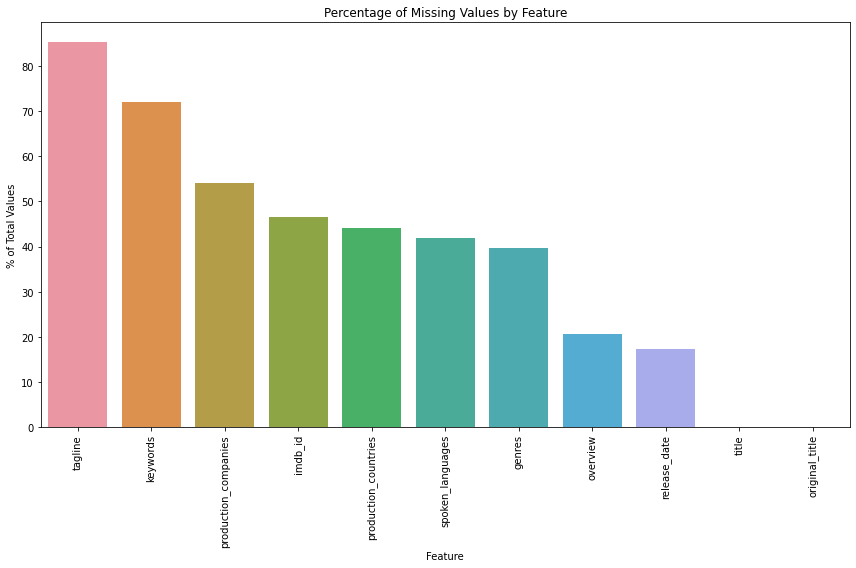

In [0]:
def plot_missing_values(mis_val_table, title):
    """
    Plots the percentage of missing values per feature, showing feature names on the x-axis.
    Assumes `mis_val_table` has a column 'Column' with the feature names and
    '% of Total Values' with the missing-value percentages.
    """
    plt.figure(figsize=(12, 8))

    # Use the 'Column' column for x-labels
    sns.barplot(
        data=mis_val_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate the x labels for better readability
    plt.xticks(rotation=90)

    # Set plot labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# Call the function to plot the missing values with feature names shown
plot_missing_values(missing_values, title='Percentage of Missing Values by Feature')

In [0]:
# Updated function to include a 'Column' column instead of using the index
def zero_values_table_spark(df):

    # For each column, count how many values equal zero
    zero_counts = df.select([F.sum(F.when(F.col(c) == 0, 1).otherwise(0)).alias(c) for c in df.columns])

    # Convert result to Pandas for easier manipulation
    zero_counts_pd = zero_counts.toPandas().transpose()

    # Compute percentage
    row_count = df.count()
    zero_percent = (zero_counts_pd[0] / row_count) * 100

    # Create summary table
    zero_table = pd.concat([zero_counts_pd, zero_percent], axis=1)
    zero_table.columns = ['Zero Values', '% of Total Values']

    # Keep only columns with zeros, sort and round
    zero_table = (
        zero_table[zero_table['Zero Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so column names appear as a column
    zero_table = zero_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {zero_table.shape[0]} columns that have zero values.")

    return zero_table

# Use the function
zero_values = zero_values_table_spark(df)
display(zero_values)

Your selected dataframe has 21 columns.
There are 12 columns that have zero values.


Column,Zero Values,% of Total Values
revenue,1027899,98.0
budget,991807,94.6
adult,951555,90.7
vote_average,697950,66.6
vote_count,697613,66.5
runtime,293833,28.0
popularity,137908,13.2
title,43,0.0
original_title,43,0.0
overview,8,0.0


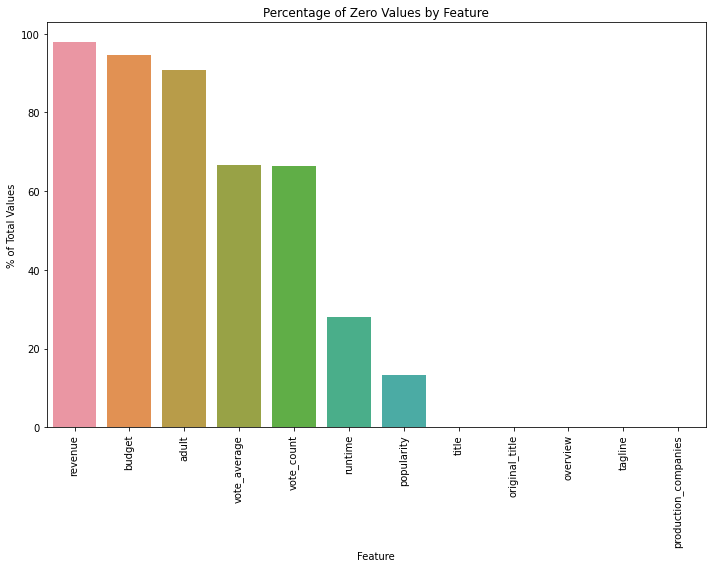

In [0]:
def plot_zero_values(zero_table, title):
    """
    Plots the percentage of zero values per feature, using the 'Column' column
    for the x-axis labels.
    """
    plt.figure(figsize=(10, 8))

    sns.barplot(
        data=zero_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate x-labels for readability
    plt.xticks(rotation=90)

    # Set labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# print
plot_zero_values(zero_values, title='Percentage of Zero Values by Feature')

## Missing or Zero Values Summary

### Missing Values
These columns have significant number of null entries:
- **tagline** (85.4% missing)  
- **keywords** (72.1% missing)  
- **production_companies** (54.2% missing)
- **imdb_id** (46.5% missing)  
- **production_countries** (44.2% missing)  
- **spoken_languages** (~42% missing)  
- **genres** (39.6% missing)  
- **overview** (20.6% missing)  
- **release_date** (17.3% missing)

### Zero Values
The following columns contain a substantial fraction of zeros:
- **revenue** (98% zeros)  
- **budget** (94.6% zeros)  
- **adult** (90.7% zeros)
- **vote average** (66.6% zeros)
- **vote_count** (66.5%)   
- **runtime** (28% zeros) 
- **popularity** (13.2% zeros)   


## REVENUE and BUDGET

Both **revenue** and **budget** are currently in string data type. We need them both as integers. (Alternatively, we could cast them to float point numbers, however, we do not need to be decimal point specific.)

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for revenue and budget
total = df.count()

for cname in ["revenue", "budget"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == 0).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zeros={zeros}"
    )

revenue: total=1048575, nulls=0, empty strings=0, 'None'/'none' strings=0, zeros=1027899
budget: total=1048575, nulls=0, empty strings=0, 'None'/'none' strings=0, zeros=991807


In [0]:
# Cast revenue and budget to long (64-bit integer)
df = df.withColumn(
        "revenue", col("revenue").cast("long")
    ).withColumn(
        "budget",  col("budget").cast("long")
    )

# Verify that the types have been updated
df.select("revenue", "budget").printSchema()

root
 |-- revenue: long (nullable = true)
 |-- budget: long (nullable = true)



Now, we will drop the rows where **revenue** == 0.

In [0]:
#Count total rows before filtering
initial_count = df.count()

# Filter to only movies with revenue > 0
df = df.filter(col("revenue").isNotNull() & (col("revenue") > 0))

# Count rows after filtering
final_count = df.count()

# Compute how many were dropped
dropped_count = initial_count - final_count

# Report
print(f"Dropped {dropped_count} movies with zero or null revenue.")
print(f"Remaining movies for training: {final_count}")

Dropped 1027900 movies with zero or null revenue.
Remaining movies for training: 20675


We drop all movies with revenue == 0 because in our dataset those zeroes overwhelmingly represent missing or unreported box-office figures—not true earnings—and including them would force the model to learn spurious patterns tied to data availability rather than actual revenue drivers. By training only on films with known, positive revenue, we ensure the regression learns genuine relationships (e.g. between budget, popularity, genre, etc.) and avoids biasing predictions toward “zero” whenever it encounters features associated with unreleased or untracked titles.

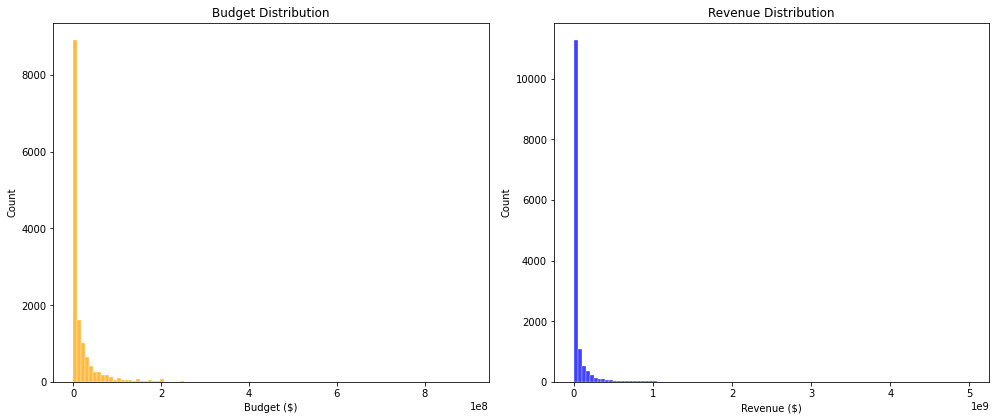

In [0]:
# Filter 
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Select and convert necessary columns to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Plot original distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.set(style="whitegrid")

# Budget distribution
sns.histplot(df_money_pd['budget'], bins=100, ax=axes[0], color='orange')
axes[0].set_title('Budget Distribution')
axes[0].set_xlabel('Budget ($)')
axes[0].set_ylabel('Count')

# Revenue distribution
sns.histplot(df_money_pd['revenue'], bins=100, ax=axes[1], color='blue')
axes[1].set_title('Revenue Distribution')
axes[1].set_xlabel('Revenue ($)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

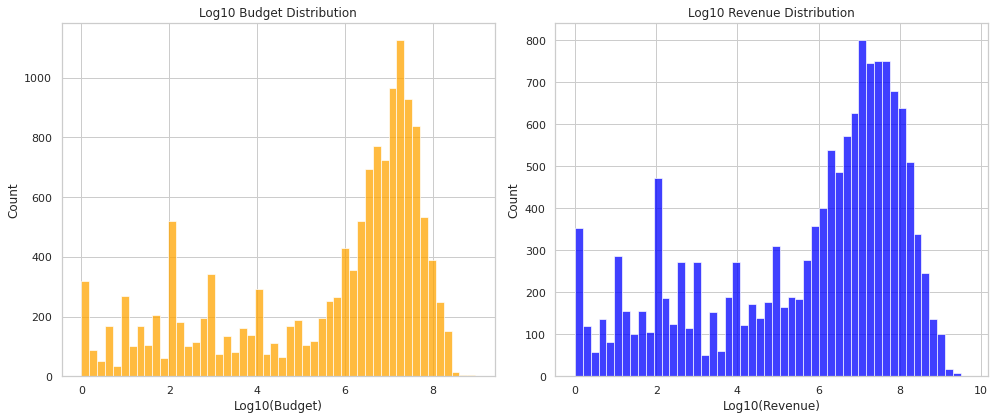

In [0]:
# Filter Spark DataFrame for positive budget and revenue
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Convert to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Apply log10 transformation
df_money_pd['log_budget'] = np.log10(df_money_pd['budget'])
df_money_pd['log_revenue'] = np.log10(df_money_pd['revenue'])

# Plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(df_money_pd['log_budget'], bins=50, ax=axes[0], color='orange')
axes[0].set_title('Log10 Budget Distribution')
axes[0].set_xlabel('Log10(Budget)')

sns.histplot(df_money_pd['log_revenue'], bins=50, ax=axes[1], color='blue')
axes[1].set_title('Log10 Revenue Distribution')
axes[1].set_xlabel('Log10(Revenue)')

plt.tight_layout()
plt.show()

Budget and Revenue (log₁₀) Distributions

Log₁₀(Budget)
The bulk of film budgets cluster around log₁₀(budget) ≈ 6.5–7.5, i.e. budgets of roughly \$3 million to \$30 million. Most budgets fall between log₁₀ ≈ 5 (≈ \$100 k) and log₁₀ ≈ 8 (≈ \$100 million). There is a long left‐hand tail extending down toward zero (very low‐budget or no‐budget films), and a shorter right tail tapering off beyond log₁₀ ≈ 8. Small peaks around log₁₀ ≈ 2–3 (\$100–\$1 000 budgets) and log₁₀ ≈ 4–5 (\$10 000–\$100 000) likely correspond to micro‐budget productions.

Log₁₀(Revenue)
Revenues tend to concentrate around log₁₀(revenue) ≈ 7–8, i.e. \$10 million to \$100 million. Revenues span from very low figures (log₁₀ ≈ 0–2, under \$100–\$100) up to blockbuster grosses (log₁₀ ≈ 9+, over \$1 billion), though the extreme high end thins out sharply. The distribution is right‐skewed, with a heavy left tail of low‐earning films and a tapering right tail of big‐blockbusters. A visible bump near log₁₀ ≈ 4–5 (\$10 000–\$100 000) suggests a cluster of modest indie releases, and occasional spikes around log₁₀ ≈ 2 (\$100–\$1 000) reflect very small‐scale runs or data artifacts.

Overall, both distributions are left-skewed on the log scale, with most films clustering in the mid‐range budgets and revenues, but with long tails toward both the ultra‐low and the ultra‐high ends.

In [0]:

# Movies with revenue == 0 but budget != 0
zero_rev_nonzero_budget = df.filter((col("revenue") == 0) & (col("budget") != 0))
count_zero_rev_nonzero_budget = zero_rev_nonzero_budget.count()
print(f"Movies with revenue = 0 and budget != 0: {count_zero_rev_nonzero_budget}")
display(zero_rev_nonzero_budget.limit(5))

# Movies with budget == 0 but revenue != 0
zero_budget_nonzero_rev = df.filter((col("budget") == 0) & (col("revenue") != 0))
count_zero_budget_nonzero_rev = zero_budget_nonzero_rev.count()
print(f"Movies with budget = 0 and revenue != 0: {count_zero_budget_nonzero_rev}")
display(zero_budget_nonzero_rev.limit(5))

Movies with revenue = 0 and budget != 0: 0


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords


Movies with budget = 0 and revenue != 0: 6510


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
372058,Your Name.,8.514,10303,Released,8/26/2016,357986087,106,false,0,tt5311514,ja,君の名は。,"High schoolers Mitsuha and Taki are complete strangers living separate lives. But one night, they suddenly switch places. Mitsuha wakes up in Taki’s body, and he in hers. This bizarre occurrence continues to happen randomly, and the two must adjust their lives around each other.",68.999,"It was almost like seeing something out of a dream, nothing more or less than a breathtaking view.","Romance, Animation, Drama","CoMix Wave Films, TOHO, KADOKAWA, East Japan Marketing & Communications, AMUSE, voque ting, Lawson Entertainment, 4Kids Entertainment",Japan,Japanese,"race against time, afterlife, natural disaster, supernatural, time travel, comet, romance, tragedy, school, body-swap, nonlinear timeline, star crossed lovers, anime, dreams"
664413,365 Days,7.063,8429,Released,2/7/2020,9458590,116,false,0,tt10886166,pl,365 dni,"A woman falls victim to a dominant mafia boss, who imprisons her and gives her one year to fall in love with him.",32.781,null,"Romance, Drama","Ekipa, Future Space, Next Film, TVN Group",Poland,"English, French, Italian, Polish","kidnapping, gangster, yacht, nightclub, mansion, prostitution, relationship, softcore, mature, bdsm, rich man poor woman, disturbed, aggressive, abduction, sex, antagonistic, arrogant, disgusted, disrespectful"
200727,"Love, Rosie",7.837,5918,Released,10/16/2014,4439431,102,false,0,tt1638002,en,"Love, Rosie","Since the moment they met at age 5, Rosie and Alex have been best friends, facing the highs and lows of growing up side by side. A fleeting shared moment, one missed opportunity, and the decisions that follow send their lives in completely different directions. As each navigates the complexities of life, love, and everything in between, they always find their way back to each other - but is it just friendship, or something more?",29.428,Right Love. Wrong Time.,"Romance, Drama, Comedy","Constantin Film, Octagon Films, Canyon Creek Films, Mister Smith Entertainment, FFF Bayern, FFA, MEDIA Programme of the European Union, OMDC","Belgium, Canada, Germany, Ireland, United Kingdom",English,"friendship, based on novel or book, love, best friend, valentine's day, teenage pregnancy, friends in love, missed opportunity"
181886,Enemy,6.873,5383,Released,12/31/2013,3396726,91,false,0,tt2316411,en,Enemy,A mild-mannered college professor discovers a look-alike actor and delves into the other man's private affairs.,18.187,You can’t escape Yourself!,"Thriller, Mystery","Rhombus Media, Roxbury Pictures, Mecanismo Films, micro_scope, Entertainment One, Pathé","Canada, France, Spain",English,"infidelity, based on novel or book, nightmare, professor, pregnancy, paranoia, toronto, canada, delusion, symbolism, spider, surrealism, mental illness, dream sequence, doppelgänger, double identity, subconscious"
613504,After We Collided,7.202,5051,Released,9/2/2020,42000000,105,false,0,tt10362466,en,After We Collided,Tessa finds herself struggling with her complicated relationship with Hardin; she faces a dilemma that could change their lives forever.,121.032,Can love overcome the past?,"Romance, Drama","Voltage Pictures, Offspring Entertainment, Frayed Pages Entertainment, Wattpad",United States of America,English,"based on novel or book, love, teenage crush"


In [0]:
# Movies with negative budget
neg_budget_count = df.filter(col("budget") < 0).count()
print(f"Number of movies with negative budget: {neg_budget_count}")

#  Movies with negative revenue
neg_revenue_count = df.filter(col("revenue") < 0).count()
print(f"Number of movies with negative revenue: {neg_revenue_count}")
display(df.filter(col("revenue") < 0))


Number of movies with negative budget: 0
Number of movies with negative revenue: 0


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords


##ID and IMDB_ID 

First, we will check for duplicates by **id** and **imdb_id**

In [0]:
# Calculate total and distinct counts
total_rows = df.count()
unique_id = df.select(countDistinct("id")).collect()[0][0]
unique_imdb_id = df.select(countDistinct("imdb_id")).collect()[0][0]

# Calculate duplicated counts
duplicated_id = total_rows - unique_id
duplicated_imdb_id = total_rows - unique_imdb_id

# Print results
print(f"Total duplicated IDs: {duplicated_id}")
print(f"Total duplicated IMDB IDs: {duplicated_imdb_id}")

# Display examples of duplicated 'id' rows
dup_id_vals = (
    df
    .groupBy("id")
    .count()
    .filter(col("count") > 1)
    .select("id")
)
dup_id_rows = (
    df
    .join(dup_id_vals, on="id", how="inner")
    .orderBy("id")
)
print("Examples of duplicated 'id' rows:")
display(dup_id_rows.limit(10))

# Display examples of duplicated 'imdb_id' rows 
dup_imdb_vals = (
    df
    .groupBy("imdb_id")
    .count()
    .filter(col("count") > 1)
    .select("imdb_id")
)
dup_imdb_rows = (
    df
    .join(dup_imdb_vals, on="imdb_id", how="inner")
    .orderBy("imdb_id")
)
print("Examples of duplicated 'imdb_id' rows:")
display(dup_imdb_rows.limit(10))

Total duplicated IDs: 2
Total duplicated IMDB IDs: 3757
Examples of duplicated 'id' rows:


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
1359568,Agham,0.0,0,Released,9/20/2024,1000,14,false,1000,null,en,Agham,"A writer escapes to a distant land to flee his past and pen his autobiography. However, he soon finds himself caught in a series of strange events, which eventually take a new turn.",1.4,null,"Drama, Crime, Fantasy",Infinity and beyond pixels inc.,null,null,"writer, social injustice, reality vs fantasy, self reflection, crime"
1359568,Agham,0.0,0,Released,null,1000,14,false,1000,null,en,Agham,"A writer escapes to a distant land to flee his past and pen his autobiography. However, he soon finds himself caught in a series of strange events, which eventually take a new turn.",0.0,null,null,null,null,null,null
1403129,The Tie,0.0,0,Released,null,100000,0,false,15000,tt13235918,en,The Tie,null,0.0,null,null,null,null,null,null
1403129,The Tie,0.0,0,Released,null,100000,20,false,15000,tt13235918,en,The Tie,"Sarah is a brave cheating woman who complicates the relationship between her house boyfriend and her side guy. In the terrible midst of frustrations, she seeks solutions to the unknown.",0.6,Zulu,null,null,null,null,null


Examples of duplicated 'imdb_id' rows:


imdb_id,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
None,1410686,Bad E-Learning,0.0,0,Released,null,5000,13,false,50,en,Bad E-Learning,"We check back in with Teacher of the Year ""Nominee"", Schmuel to see what he's been up to since his influential nomination.",0.6,The teacher is back,null,null,null,null,null
None,1410672,Teacher Of The Year,0.0,0,Released,null,50000,8,false,50,en,Teacher Of The Year,"We get an insight into one of the Teacher of the Year Nominee's ""Schmuel"". Get into the classroom, sit down and pay attention, there's a lot to learn.",0.6,There's a lot to learn.,null,null,null,null,null
None,1410598,"anyway, don't be a stranger",0.0,0,Released,3/6/2024,20,1,false,20,en,"anyway, don't be a stranger",null,1.4,i hope.. you won't forget me,null,null,null,null,null
None,1410736,Kim: Masum?,10.0,2,Released,null,1,0,false,1,tr,Kim: Masum?,null,1.4,null,null,Anka Medya,null,Turkish,null
tt12257166,1194311,Blazed,10.0,1,Released,11/24/2009,230000,21,false,13000,en,Blazed,"After their friend dies, two stoners pretend he's alive until they can bury him in the backyard. Starring: Serio, Sean Curran, Andrey Makarov, and Spencer Waagenaar",0.6,Blazed,"Thriller, Mystery, Music, Horror, Drama, Crime, Action",Serio Controla Records,United States of America,English,"serio, blazed"
tt12257166,1326173,Blazed,10.0,1,Released,11/24/2009,1200000,21,false,120000,en,Blazed,"After their friend dies, two stoners pretend he's alive until they can bury him in the backyard.",0.932,Blazed,"Horror, Comedy, Drama",Serio Controla Entertainment,null,English,null
tt13235918,1403129,The Tie,0.0,0,Released,null,100000,20,false,15000,en,The Tie,"Sarah is a brave cheating woman who complicates the relationship between her house boyfriend and her side guy. In the terrible midst of frustrations, she seeks solutions to the unknown.",0.6,Zulu,null,null,null,null,null
tt13235918,1403129,The Tie,0.0,0,Released,null,100000,0,false,15000,en,The Tie,null,0.0,null,null,null,null,null,null
tt14900638,1222223,PC Plum: Perfection Cop S1,0.0,0,Released,null,380,0,false,435,en,PC Plum: Perfection Cop S1,null,0.0,null,null,null,null,null,null
tt14900638,1230785,PC Plum: Perfection Cop S1,0.0,0,Released,5/29/2021,700,10,false,500,en,PC Plum: Perfection Cop S1,PC Plum is tasked to investigate various situations that are going on in the Ultranian Kingdom.,0.6,I'm PC Plum and I'm Perfection Cop,Comedy,Elephant Tree Productions,United Kingdom,null,null


In [0]:
# Count how many "None" strings are in imdb_id
none_count = df.filter(col("imdb_id") == "None").count()

# Replace "None" strings with actual nulls
df = df.withColumn(
    "imdb_id",
    when(col("imdb_id") == "None", None)
      .otherwise(col("imdb_id"))
)

# Print how many values were set to null
print(f"Number of 'None' values replaced with null in 'imdb_id': {none_count}")


Number of 'None' values replaced with null in 'imdb_id': 4


In [0]:
# Calculate counts for non-null imdb_id values
non_null_rows = df.filter(col("imdb_id").isNotNull()).count()
unique_non_null = (
    df
    .filter(col("imdb_id").isNotNull())
    .select(countDistinct("imdb_id"))
    .collect()[0][0]
)
duplicated_imdb_id = non_null_rows - unique_non_null

# Print the results
print(f"Total non-null imdb_id rows: {non_null_rows}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")

# Display examples of duplicated 'imdb_id' rows
dup_imdb_vals = (
    df
    .filter(col("imdb_id").isNotNull())
    .groupBy("imdb_id")
    .count()
    .filter(col("count") > 1)
    .select("imdb_id")
)

dup_imdb_rows = (
    df
    .join(dup_imdb_vals, on="imdb_id", how="inner")
    .orderBy("imdb_id")
)

print("Examples of duplicated 'imdb_id' rows:")
display(dup_imdb_rows.limit(10))


Total non-null imdb_id rows: 16928
Total duplicated IMDB IDs (excluding nulls): 11
Examples of duplicated 'imdb_id' rows:


imdb_id,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
tt12257166,1326173,Blazed,10.0,1,Released,11/24/2009,1200000,21,false,120000,en,Blazed,"After their friend dies, two stoners pretend he's alive until they can bury him in the backyard.",0.932,Blazed,"Horror, Comedy, Drama",Serio Controla Entertainment,null,English,null
tt12257166,1194311,Blazed,10.0,1,Released,11/24/2009,230000,21,false,13000,en,Blazed,"After their friend dies, two stoners pretend he's alive until they can bury him in the backyard. Starring: Serio, Sean Curran, Andrey Makarov, and Spencer Waagenaar",0.6,Blazed,"Thriller, Mystery, Music, Horror, Drama, Crime, Action",Serio Controla Records,United States of America,English,"serio, blazed"
tt13235918,1403129,The Tie,0.0,0,Released,null,100000,0,false,15000,en,The Tie,null,0.0,null,null,null,null,null,null
tt13235918,1403129,The Tie,0.0,0,Released,null,100000,20,false,15000,en,The Tie,"Sarah is a brave cheating woman who complicates the relationship between her house boyfriend and her side guy. In the terrible midst of frustrations, she seeks solutions to the unknown.",0.6,Zulu,null,null,null,null,null
tt14900638,1222223,PC Plum: Perfection Cop S1,0.0,0,Released,null,380,0,false,435,en,PC Plum: Perfection Cop S1,null,0.0,null,null,null,null,null,null
tt14900638,1230785,PC Plum: Perfection Cop S1,0.0,0,Released,5/29/2021,700,10,false,500,en,PC Plum: Perfection Cop S1,PC Plum is tasked to investigate various situations that are going on in the Ultranian Kingdom.,0.6,I'm PC Plum and I'm Perfection Cop,Comedy,Elephant Tree Productions,United Kingdom,null,null
tt20870504,1222414,JCHS: A Christmas Miracle,0.0,0,Released,null,134,0,false,235,en,JCHS: A Christmas Miracle,null,0.0,null,null,null,null,null,null
tt20870504,1230779,JCHS: A Christmas Miracle,0.0,0,Released,12/25/2021,423,10,false,623,en,JCHS: A Christmas Miracle,The first JCHS Christmas special to which PC Plum and Ben Sapphire get a visit from Jesus. What follows is deep conversations and lots of laughs.,0.775,"Hey guys, I'm back!",Comedy,Elephant Tree Productions,null,null,null
tt26900526,1309523,Emesis Blue,0.0,0,Released,null,31,108,false,0,en,Emesis Blue,"When an executive of the BLU Corporation mysteriously vanishes in Mortem, New Mexico, a private detective and washed-up war veteran team up to find him, yet the man they hunt is more dangerous than they can possibly imagine.",0.6,You ever feel like you're being watched?,null,null,null,null,null
tt26900526,1246047,Emesis Blue,0.0,0,Released,null,31602,108,false,0,en,Emesis Blue,"When an executive of the BLU Corporation mysteriously vanishes in Mortem, New Mexico, a private detective and washed-up war veteran team up to find him, yet the man they hunt is more dangerous than they can possibly imagine.",0.0,null,"Horror, Animation",null,null,null,null


Turns out that the duplicated rows by **id** column are in fact duplicates. 
- We will deduplicate and leave only the row with the lest number of null values.

When it comes to **imdb_id**, those also concern the same movies but with original and translated titles. 
- We will deduplicate using the same logic as we used with **id**


In [0]:
def drop_duplicates_keep_least_null(df, id_col="id"):
    """
    Remove duplicate rows among those with non-null `id_col`, keeping the row with the fewest null values.
    Rows where `id_col` is null are left untouched.
    Prints how many rows were dropped among non-null IDs.
    """
    # Split into rows with and without an ID
    non_null_df = df.filter(col(id_col).isNotNull())
    null_df     = df.filter(col(id_col).isNull())
    
    # Count non-null rows before deduplication
    orig_count = non_null_df.count()
    
    # For each row, count how many columns are null
    null_count_expr = sum(
        when(col(c).isNull(), 1).otherwise(0) for c in non_null_df.columns
    ).alias("_null_count")
    nn_with_nulls = non_null_df.withColumn("_null_count", null_count_expr)
    
    # Within each id group, rank rows by null_count ascending
    window = Window.partitionBy(id_col).orderBy(col("_null_count").asc())
    ranked = nn_with_nulls.withColumn("_rn", row_number().over(window))
    
    # Keep only the first row for each id (fewest nulls), drop helper cols
    deduped_non_null = (
        ranked
        .filter(col("_rn") == 1)
        .drop("_null_count", "_rn")
    )
    
    # Count how many non-null rows were dropped
    new_count = deduped_non_null.count()
    dropped = orig_count - new_count
    print(f"Dropped {dropped} duplicate rows among non-null '{id_col}'.")
    
    # Combine back with the untouched null-ID rows
    result_df = deduped_non_null.unionByName(null_df)
    return result_df

# Use the function to deduplicate by "id", preserving rows with null id
df = drop_duplicates_keep_least_null(df, id_col="id")

display(df.limit(10))

Dropped 2 duplicate rows among non-null 'id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
26,Walk on Water,6.9,80,Released,2/5/2004,444,103,false,1400000,tt0352994,he,LaLehet Al HaMayim,"Eyal, an Israeli Mossad agent, is given the mission to track down and kill the very old Alfred Himmelman, an ex-Nazi officer, who might still be alive. Pretending to be a tourist guide, he befriends his grandson Axel, in Israel to visit his sister Pia. The two men set out on a tour of the country, during which Axel challenges Eyal's values.",5.316,He was trained to hate until he met the enemy.,Drama,"Lama Films, United King Films","Israel, Sweden","English, Arabic, Hebrew, German, Turkish, Italian","israel, palestinian-israeli conflict, berlin, germany, neo-nazism, chauffeur, dead sea, mossad, nazi, homophobia, jerusalem, israel, gay club, anti-semitism, kibbutz, suicide mission, lgbt, gay theme"
27,9 Songs,5.653,462,Released,7/16/2004,1574623,69,false,1000000,tt0411705,en,9 Songs,"Matt, a young glaciologist, soars across the vast, silent, icebound immensities of the South Pole as he recalls his love affair with Lisa. They meet at a mobbed rock concert in a vast music hall - London's Brixton Academy. They are in bed at night's end. Together, over a period of several months, they pursue a mutual sexual passion whose inevitable stages unfold in counterpoint to nine live-concert songs.",30.475,"2 lovers, one summer, and the 9 songs that defined them.","Drama, Music, Romance",Revolution Films,United Kingdom,English,"london, england, concert, rock 'n' roll, sexuality, orgasm, cocaine, man woman relationship, condom, love, sexual fantasy, pubic hair, breast, ejaculation, american, couple, desire, sexual desire, cunnilingus, naked, exchange student, rock concert, british man, nude, drug, small tits, woman tied to a bed, sex, sexual, vulva, rock, unsimulated sex, intense, fellatio, tied to a bed, erect penis, small breasts, blowjob"
28,Apocalypse Now,8.282,7485,Released,8/15/1979,150000000,147,false,31500000,tt0078788,en,Apocalypse Now,"At the height of the Vietnam war, Captain Benjamin Willard is sent on a dangerous mission that, officially, ""does not exist, nor will it ever exist."" His goal is to locate - and eliminate - a mysterious Green Beret Colonel named Walter Kurtz, who has been leading his personal army on illegal guerrilla missions into enemy territory.",37.715,This is the end...,"Drama, War","United Artists, American Zoetrope",United States of America,"Khmer, English, French, Vietnamese","guerrilla warfare, epic, vietnam war, journalist, mission, vietnam, vietcong, cia, cambodia, army, drug abuse, based on novel or book, secret mission, insanity, surrealism, tribe, green beret, jungle, descent into madness, brutality, riverboat, military, anti war"
65,8 Mile,7.124,6692,Released,11/8/2002,242875078,111,false,41000000,tt0298203,en,8 Mile,"For Jimmy Smith, Jr., life is a daily fight just to keep hope alive. Feeding his dreams in Detroit's vibrant music scene, Jimmy wages an extraordinary personal struggle to find his own voice - and earn a place in a world where rhymes rule, legends are born and every moment… is another chance.",36.179,Every Moment Is Another Chance,"Drama, Music","Mikona Productions, Imagine Entertainment","Germany, United States of America",English,"individual, adolescence, rap music, hip-hop, rhyme battle, trailer park, street gang, ethnic stereotype, rapper, ghetto, single, detroit, michigan, 1990s, battle rap"
76,Before Sunrise,7.973,3722,Released,1/27/1995,5987386,101,false,2500000,tt0112471,en,Before Sunrise,"A young man and woman meet on a train in Europe, and wind up spending one evening together in Vienna. Unfortunately, both know that this will probably be their only night together.",22.285,Can the greatest romance of your life last only one night?,"Drama, Romance","Castle Rock E

In [0]:
# Now drop duplicates by imdb_id
df = drop_duplicates_keep_least_null(df, id_col="imdb_id")

# Inspect a few rows to confirm
display(df.limit(10))

Dropped 10 duplicate rows among non-null 'imdb_id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
174104,The Spoilers,6.2,3,Released,4/10/1914,4100000,110,false,0,tt0004630,en,The Spoilers,"The Spoilers is a 1914 film directed by Colin Campbell. It is set in Nome, Alaska during the 1898 Gold Rush, with William Farnum as Roy Glennister, Kathlyn Williams as Cherry Malotte, and Tom Santschi as Alex McNamara. The film culminates in a spectacular saloon fistfight between Glennister and McNamara. It was adapted to screen by Lanier Bartlett from the Rex Beach novel of the same name.",0.6,null,"Romance, Western",Selig Polyscope Company,United States of America,null,"alaska, silent film, nome alaska, saloon brawl, klondike gold rush, partially lost film"
70368,The Cheat,5.983,58,Released,12/13/1915,137365,59,false,17311,tt0005078,en,The Cheat,"A venal, spoiled stockbroker's wife impulsively embezzles $10,000 from the charity she chairs and desperately turns to a Burmese ivory trader to replace the stolen money.",3.104,null,Drama,"Jesse L. Lasky Feature Play Company, Paramount",United States of America,No Language,null
278480,A Daughter of the Gods,3.5,2,Released,10/16/1916,1390000,180,false,1000000,tt0006568,en,A Daughter of the Gods,A sultan agrees to help an evil witch destroy a mysterious beauty if the witch will bring his young son back to life.,0.887,null,"Fantasy, Drama",Fox Film Corporation,United States of America,null,null
132410,The Ghost of Slumber Mountain,6.0,8,Released,11/17/1918,3000,16,false,3000,tt0009105,en,The Ghost of Slumber Mountain,"In a dream Uncle Jack looks through a magic telescope owned by the ghost of a hermit and sees what life was like millions of years ago, including a battle between prehistoric monsters.",1.116,"These giant monsters of the past are seen to breathe, to live again, to move and battle as they did at dawn of life.","Fantasy, Animation",Herbert M. Dawley Production,United States of America,No Language,"stop motion, dinosaur, silent film, partially lost film"
899,Broken Blossoms,6.874,199,Released,5/13/1919,2400000,89,false,0,tt0009968,en,Broken Blossoms,The love story of an abused English girl and a Chinese Buddhist in a time when London was a brutal and harsh place to live.,7.716,A Tale of Forbidden Love,"Drama, Romance","D.W. Griffith Productions, United Artists",United States of America,No Language,"suicide, london, england, china, boxer, buddhist, murder, racism, black and white, alcoholic, silent film, based on short story"
10098,The Kid,8.195,1874,Released,1/21/1921,2500000,68,false,250000,tt0012349,en,The Kid,A tramp cares for a boy after he's abandoned as a newborn by his mother. Later the mother has a change of heart and aches to be reunited with her son.,11.172,6 reels of Joy.,"Comedy, Drama",Charles Chaplin Productions,United States of America,No Language,"angel, suicide attempt, fistfight, slapstick comedy, black and white, class differences, foundling, silent film, dream sequence, semi autobiographical, car theft, little tramp, illegitimate child, unwed mother, abandoned baby, out of wedlock child, raised like own child, good deed doer"
35227,Foolish Wives,6.6,75,Released,1/11/1922,400200,143,false,1100000,tt0013140,en,Foolish Wives,A con artist masquerades as Russian nobility and attempts to seduce the wife of an American diplomat.,5.13,null,"Drama, Thriller",Universal Film Manufacturing Company,United States of America,No Language,"court, monte carlo, wig"
28963,The Thief of Bagdad,7.318,140,Released,3/18/1924,1490419,149,false,1135654,tt0015400,en,The Thief of Bagdad,A recalcitrant thief vies with a duplicitous Mongol ruler for the hand of a beautiful princess.,10.927,"""Happiness Must Be Earned""","Romance, Adventure, Fantasy",Douglas Fairbanks Pictures,United States of America,No Language,"princess, treasure, magic, palace, flying carpet, rope, thi

In [0]:
# Sanity check - recalculate duplicates
# Total rows
total_rows = df.count()

# id duplicates (id never null)
unique_id = df.select(countDistinct("id")).collect()[0][0]
duplicated_id = total_rows - unique_id

# imdb_id duplicates (exclude null/"None")
valid_imdb = df.filter(col("imdb_id").isNotNull() & (col("imdb_id") != "None"))
total_valid = valid_imdb.count()
unique_imdb = valid_imdb.select(countDistinct("imdb_id")).collect()[0][0]
duplicated_imdb_id = total_valid - unique_imdb

print(f"Total duplicated IDs: {duplicated_id}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")


Total duplicated IDs: 0
Total duplicated IMDB IDs (excluding nulls): 0


Now, **id** and **imdb_id** columns are deduplicated. Their datatype is correct, so no need for further changes.

## TITLE

In [0]:
# Count null, empty, and "None"/"none" titles
null_count = df.filter(col("title").isNull()).count()
empty_count = df.filter((col("title") == "") | (col("title") == " ")).count()
none_count = df.filter((col("title") == "None") | (col("title") == "none")).count()

print(f"Null titles: {null_count}")
print(f"Empty titles: {empty_count}")
print(f"None titles: {none_count}")

Null titles: 0
Empty titles: 0
None titles: 0


In [0]:
# Title length distribution
title_len_df = df.withColumn("title_length", length(col("title")))
min_len = title_len_df.agg({"title_length": "min"}).collect()[0][0]
max_len = title_len_df.agg({"title_length": "max"}).collect()[0][0]
median_len = title_len_df.approxQuantile("title_length", [0.5], 0.01)[0]
print(f"Title length — min: {min_len}, median: {median_len:.0f}, max: {max_len}")

# Show extremes
print("Longest titles:")
display(
    title_len_df
    .orderBy(col("title_length").desc())
    .select("id", "title", "title_length")
    .limit(5)
)
print("Shortest non-empty titles:")
display(
    title_len_df
    .filter(col("title").isNotNull() & (col("title") != ""))
    .orderBy(col("title_length").asc())
    .select("id", "title", "title_length")
    .limit(5)
)


Title length — min: 1, median: 14, max: 213
Longest titles:


id,title,title_length
989531,"Titanic Tits: Rural Cosplayer (Age 19) With A Submissive Streak (Everybody Gets A Titty & Nipple Fuck & Cums On Her Tits) P-Cup With Enormous Nipples Ravished By 12 Continuous Loads In A Titty Fuck Four-Some Orgy,",213
1375813,"At an idyllic writers retreat in Morocco, a newly single novelist finds an unexpected connection with a younger man who's reevaluating his life choices.",152
1043335,"120% of the time, you'll encounter a pervert! The AV debut of Iori Yugi, a wife with extra large 128 cm P-cup tits that will amaze anyone!",138
1042427,"Wife with super big nipples and P-cup breasts who has been raped for a long time, training and Nakadashi sexual intercourse, Iori Yuuki",135
1393343,Las espantosas aventuras de una rubia tonta y un valenciano de pueblo que se convierte en dinosaurio en un museo paleontológico 2,129


Shortest non-empty titles:


id,title,title_length
717807,G,1
11065,O,1
1020263,I,1
1061979,春,1
1371237,b,1


**title** column does not have any missing values and has the right data type.

##VOTE_AVERAGE and VOTE_COUNT

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for vote_average and vote_count
total = df.count()

for cname in ["vote_average", "vote_count"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") | (col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}"
    )

vote_average: total=20663, nulls=0, empty strings=0, 'None'/'none' strings=0
vote_count: total=20663, nulls=0, empty strings=0, 'None'/'none' strings=0


First, we need to cast **vote_average** and **vote_count** into correct data types:

In [0]:
# Cast vote_average to double and vote_count to integer
df = (
    df
    .withColumn("vote_average", col("vote_average").cast("double"))
    .withColumn("vote_count",    col("vote_count").cast("integer"))
)

# Verify schema
df.select("vote_average", "vote_count").printSchema()

root
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)



In [0]:
# Count instances where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Count instances where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 3886
Number of rows with vote_count == 0: 3879


IMDb’s user rating system allows you to assign any whole-number score from 1 (the lowest) up to 10 (the highest) for any movie.

In [0]:
# Movies with vote_average below the allowed minimum (1)
below_allowed = df.filter(col("vote_average") < 1)
count_below = below_allowed.count()
print(f"Number of movies with vote_average below 1: {count_below}")

# Movies with vote_average above the allowed maximum (10)
above_allowed = df.filter(col("vote_average") > 10)
count_above = above_allowed.count()
print(f"Number of movies with vote_average above 10: {count_above}")

Number of movies with vote_average below 1: 3889
Number of movies with vote_average above 10: 0


In [0]:
# Replace those invalid vote_average values with null
df = df.withColumn(
    "vote_average",
    when(col("vote_average") < 1, None)
     .otherwise(col("vote_average"))
)

# Verify none remain
remaining_invalid = df.filter(col("vote_average") < 1).count()
print(f"Remaining vote_average < 1 after cleanup: {remaining_invalid}")

Remaining vote_average < 1 after cleanup: 0


In [0]:
# Movies where vote_count == 0 but vote_average != 0
cond = df.filter((col("vote_count") == 0) & (col("vote_average") != 0))
count = cond.count()
print(f"Number of movies with vote_count == 0 and vote_average != 0: {count}")
# Display all columns for a few examples
display(cond.limit(5))

Number of movies with vote_count == 0 and vote_average != 0: 4


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
334418,Women,7.0,0,Released,1/2/1996,9225,98,false,0,tt0117152,en,נשים,"Love, family expectations, and religion mix in 19th century Jerusalem. Jacob and Rebecca marry; he's a rabbi, she's dutiful and loving. But she has no children. Months become years. Although Jacob is content, his mother reminds everyone she is waiting for a grandson. After 15 years, Rebecca determines that Jacob must take an additional wife, the young and beautiful Sultana. Rebecca fasts and prays, and in a state of near ecstasy, persuades everyone involved and then arranges an elaborate wedding. However, Sultana does not conceive, and Rebecca watches helplessly as Jacob's affection shifts to Sultana. She's near madness and the household is in turmoil. What can Rebecca do now?",0.613,null,Drama,null,Israel,Hebrew,null
1055969,湘西剿匪记 上集,10.0,0,Released,1/1/1987,100,0,false,100,tt16085732,zh,湘西剿匪记 上集,null,0.6,null,War,潇湘电影制片厂,China,Mandarin,null
1328606,Skeye Hallelujah Cover,7.0,0,Released,12/6/2010,1000,6,false,1000,null,en,Skeye Hallelujah Cover,The Cover of Leonard Cohen's Hallelujah by Skeye,0.6,Hallelujah,"Music, Drama",Vektormusic,null,null,null
383008,真爱,8.0,0,Released,5/22/2014,151853,105,false,0,null,zh,真爱,"The story takes place in Qinghe Altay, Xinjiang, a small county surrounded by mountains. Wang Caixia, a little girl in rags and with an abscess on her head was looking for her lost elder brother Wang Yunhui. She was so lonely and homeless that Anipha adopted her. Now Anipha and Abibo have 19 kids in their family, but they still fight on with hope.",0.844,null,"Drama, Family",Tianshan Film Studio,China,Mandarin,big family


In [0]:
# Count how many rows have vote_count == 0
zero_count = df.filter(col("vote_count") == 0).count()
print(f"Found {zero_count} rows with vote_count == 0; setting vote_average to null for these.")

# Replace vote_average with null where vote_count is zero
df = df.withColumn(
    "vote_average",
    when(col("vote_count") == 0, None)
     .otherwise(col("vote_average"))
)

# Verify that no row with vote_count == 0 still has a non-null vote_average
remaining = df.filter((col("vote_count") == 0) & col("vote_average").isNotNull()).count()
print(f"Remaining rows with vote_count == 0 and non-null vote_average: {remaining}")

Found 3879 rows with vote_count == 0; setting vote_average to null for these.
Remaining rows with vote_count == 0 and non-null vote_average: 0


In [0]:

# Examples where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Examples where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 0
Number of rows with vote_count == 0: 3879


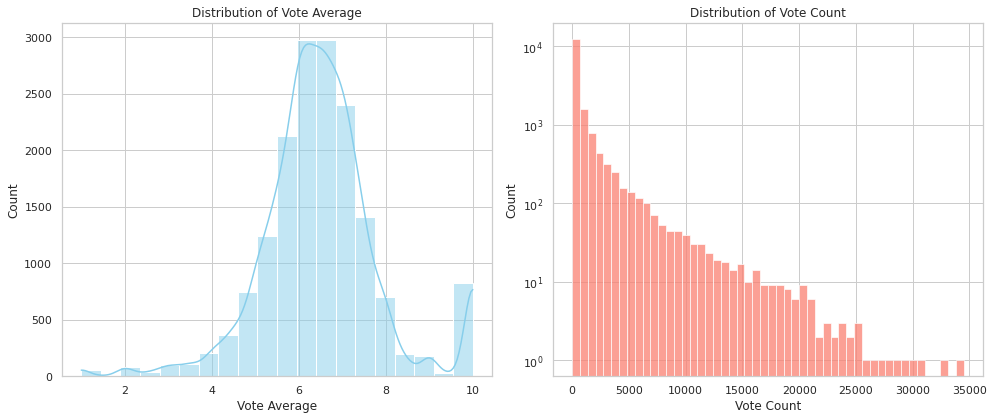

In [0]:
# Convert only the needed columns to Pandas to avoid memory issues
df_plot = df.select("vote_average", "vote_count").dropna().toPandas()

# Set seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot vote_average histogram
sns.histplot(df_plot['vote_average'], bins=20, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Vote Average')
axes[0].set_xlabel('Vote Average')
axes[0].set_ylabel('Count')

# Plot vote_count histogram (log scale)
sns.histplot(df_plot['vote_count'], bins=50, kde=False, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Vote Count')
axes[1].set_xlabel('Vote Count')
axes[1].set_ylabel('Count')
axes[1].set_yscale('log')  # log scale for better readability of skewed data

plt.tight_layout()
plt.show()

The distribution for **vote_average** looks almost normal, with a bump around 5 and 6–7, which aligns with typical average ratings on platforms like IMDb or TMDB.

When it comes to **vote_count**, there's a long tail of movies with thousands of votes, likely the popular ones. However, a big portion of movies did not receive any votes.

## STATUS

**status** is in correct data type. First, let's check for distinct values 

In [0]:
# Count distinct non-null statuses
distinct_status_count = df.filter(col("status").isNotNull()).select("status").distinct().count()
print(f"Number of distinct 'status' values (excluding nulls): {distinct_status_count}")

# Show frequency of each status
status_counts = df.groupBy("status").count().orderBy(col("count").desc())
print("Counts per status:")
display(status_counts)


Number of distinct 'status' values (excluding nulls): 6
Counts per status:


status,count
Released,20525
In Production,91
Post Production,31
Planned,14
Rumored,1
Canceled,1


In [0]:
# Calculate average and median revenue by status
status_revenue_stats = (
    df
    .groupBy("status")
    .agg(
        F.avg("revenue").alias("average_revenue"),
        F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
    )
    .orderBy("status")
)

# Display the results
display(status_revenue_stats)


status,average_revenue,median_revenue
Canceled,200.0,200
In Production,3.518205837362637E7,100
Planned,5270.214285714285,20
Post Production,9.887105564516129E7,196
Released,3.854225761851401E7,1891907
Rumored,162286.0,162286


**We need to decide whether to predict the revenue of movies with all statuses or just the ones released**

## RELEASE DATE

First, we need to handle the data type of **release_date**. Upon initial feature investigation, we realized that some dates might be in US formats and some in EU. We will need to hadle it appropriately.

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for release_date
total_rows    = df.count()
null_count    = df.filter(col("release_date").isNull()).count()
empty_count   = df.filter((col("release_date") == "") | (col("release_date") == " ")).count()
none_count    = df.filter(col("release_date").isin("None", "none")).count()

print(f"Total rows: {total_rows}")
print(f"Null release_date values          : {null_count}")
print(f"Empty-string release_date values  : {empty_count}")
print(f"'None'/'none' release_date values : {none_count}")

Total rows: 20663
Null release_date values          : 1977
Empty-string release_date values  : 0
'None'/'none' release_date values : 0


In [0]:
# Switch back to the old, pre–Spark-3.0 date parser behavior
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Trim whitespace and normalize separators (remove spaces around -, /, .)
df = df.withColumn(
    "release_date_norm",
    regexp_replace(
        trim(col("release_date")),
        r"\s*([/\-\.])\s*",
        r"$1"
    )
)

# Try parsing with a variety of common date formats
df = df.withColumn(
    "release_date_parsed",
    coalesce(
        to_date(col("release_date_norm"), "yyyy-MM-dd"),
        to_date(col("release_date_norm"), "yyyy/MM/dd"),
        to_date(col("release_date_norm"), "yyyy.MM.dd"),
        to_date(col("release_date_norm"), "MM-dd-yyyy"),
        to_date(col("release_date_norm"), "MM/dd/yyyy"),
        to_date(col("release_date_norm"), "MM.dd.yyyy"),
        to_date(col("release_date_norm"), "dd-MM-yyyy"),
        to_date(col("release_date_norm"), "dd/MM/yyyy"),
        to_date(col("release_date_norm"), "dd.MM.yyyy")
    )
)

# How many rows actually parsed to a non-null date?
total = df.count()
parsed_non_null = df.filter(col("release_date_parsed").isNotNull()).count()
parsed_null     = total - parsed_non_null

print(f"Total rows:                {total}")
print(f"Rows parsed successfully:  {parsed_non_null}")
print(f"Rows that failed to parse: {parsed_null}")


Total rows:                20663
Rows parsed successfully:  18686
Rows that failed to parse: 1977


In [0]:

# Replace the old column with the parsed one since all the rows accepted the correct type
df = df.drop("release_date").withColumnRenamed("release_date_parsed", "release_date")

# Display the DataFrame with the parsed release_date column
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
174104,The Spoilers,6.2,3,Released,4100000,110,false,0,tt0004630,en,The Spoilers,"The Spoilers is a 1914 film directed by Colin Campbell. It is set in Nome, Alaska during the 1898 Gold Rush, with William Farnum as Roy Glennister, Kathlyn Williams as Cherry Malotte, and Tom Santschi as Alex McNamara. The film culminates in a spectacular saloon fistfight between Glennister and McNamara. It was adapted to screen by Lanier Bartlett from the Rex Beach novel of the same name.",0.6,null,"Romance, Western",Selig Polyscope Company,United States of America,null,"alaska, silent film, nome alaska, saloon brawl, klondike gold rush, partially lost film",4/10/1914,1914-04-10
70368,The Cheat,5.983,58,Released,137365,59,false,17311,tt0005078,en,The Cheat,"A venal, spoiled stockbroker's wife impulsively embezzles $10,000 from the charity she chairs and desperately turns to a Burmese ivory trader to replace the stolen money.",3.104,null,Drama,"Jesse L. Lasky Feature Play Company, Paramount",United States of America,No Language,null,12/13/1915,1915-12-13
278480,A Daughter of the Gods,3.5,2,Released,1390000,180,false,1000000,tt0006568,en,A Daughter of the Gods,A sultan agrees to help an evil witch destroy a mysterious beauty if the witch will bring his young son back to life.,0.887,null,"Fantasy, Drama",Fox Film Corporation,United States of America,null,null,10/16/1916,1916-10-16
132410,The Ghost of Slumber Mountain,6.0,8,Released,3000,16,false,3000,tt0009105,en,The Ghost of Slumber Mountain,"In a dream Uncle Jack looks through a magic telescope owned by the ghost of a hermit and sees what life was like millions of years ago, including a battle between prehistoric monsters.",1.116,"These giant monsters of the past are seen to breathe, to live again, to move and battle as they did at dawn of life.","Fantasy, Animation",Herbert M. Dawley Production,United States of America,No Language,"stop motion, dinosaur, silent film, partially lost film",11/17/1918,1918-11-17
899,Broken Blossoms,6.874,199,Released,2400000,89,false,0,tt0009968,en,Broken Blossoms,The love story of an abused English girl and a Chinese Buddhist in a time when London was a brutal and harsh place to live.,7.716,A Tale of Forbidden Love,"Drama, Romance","D.W. Griffith Productions, United Artists",United States of America,No Language,"suicide, london, england, china, boxer, buddhist, murder, racism, black and white, alcoholic, silent film, based on short story",5/13/1919,1919-05-13


In [0]:
# print df
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
174104,The Spoilers,6.2,3,Released,4100000,110,false,0,tt0004630,en,The Spoilers,"The Spoilers is a 1914 film directed by Colin Campbell. It is set in Nome, Alaska during the 1898 Gold Rush, with William Farnum as Roy Glennister, Kathlyn Williams as Cherry Malotte, and Tom Santschi as Alex McNamara. The film culminates in a spectacular saloon fistfight between Glennister and McNamara. It was adapted to screen by Lanier Bartlett from the Rex Beach novel of the same name.",0.6,null,"Romance, Western",Selig Polyscope Company,United States of America,null,"alaska, silent film, nome alaska, saloon brawl, klondike gold rush, partially lost film",4/10/1914,1914-04-10
70368,The Cheat,5.983,58,Released,137365,59,false,17311,tt0005078,en,The Cheat,"A venal, spoiled stockbroker's wife impulsively embezzles $10,000 from the charity she chairs and desperately turns to a Burmese ivory trader to replace the stolen money.",3.104,null,Drama,"Jesse L. Lasky Feature Play Company, Paramount",United States of America,No Language,null,12/13/1915,1915-12-13
278480,A Daughter of the Gods,3.5,2,Released,1390000,180,false,1000000,tt0006568,en,A Daughter of the Gods,A sultan agrees to help an evil witch destroy a mysterious beauty if the witch will bring his young son back to life.,0.887,null,"Fantasy, Drama",Fox Film Corporation,United States of America,null,null,10/16/1916,1916-10-16
132410,The Ghost of Slumber Mountain,6.0,8,Released,3000,16,false,3000,tt0009105,en,The Ghost of Slumber Mountain,"In a dream Uncle Jack looks through a magic telescope owned by the ghost of a hermit and sees what life was like millions of years ago, including a battle between prehistoric monsters.",1.116,"These giant monsters of the past are seen to breathe, to live again, to move and battle as they did at dawn of life.","Fantasy, Animation",Herbert M. Dawley Production,United States of America,No Language,"stop motion, dinosaur, silent film, partially lost film",11/17/1918,1918-11-17
899,Broken Blossoms,6.874,199,Released,2400000,89,false,0,tt0009968,en,Broken Blossoms,The love story of an abused English girl and a Chinese Buddhist in a time when London was a brutal and harsh place to live.,7.716,A Tale of Forbidden Love,"Drama, Romance","D.W. Griffith Productions, United Artists",United States of America,No Language,"suicide, london, england, china, boxer, buddhist, murder, racism, black and white, alcoholic, silent film, based on short story",5/13/1919,1919-05-13


In [0]:
# Print the schema to see the data type
df.select("release_date").printSchema()

root
 |-- release_date: date (nullable = true)



In [0]:
# Check for future release dates (dates beyond today)
future_movies = df.filter(col("release_date") > current_date())

# Filter movies released before 1888-01-01
old_movies = df.filter(col("release_date") < lit("1888-01-01"))

# Count and print the result
count_future = future_movies.count()
print(f"Number of movies released after today: {count_future}")
count_old = old_movies.count()
print(f"Number of movies released before 1888: {count_old}")

Number of movies released after today: 20
Number of movies released before 1888: 1


In [0]:
# Display 30 movies with selected columns
display(
    future_movies
    .select("id", "title", "status", "release_date")
    .limit(30)
)


id,title,status,release_date
1225502,Lethal Company,In Production,2026-12-12
1226636,party animals,In Production,2027-09-26
1264644,DEAMMM,Released,2028-12-31
1277126,Jude on 17 memory,Released,2026-12-09
1290550,Sabrisalgados,In Production,2025-07-16
1325772,The Voices In FAO's Head,In Production,2029-12-25
1354257,All is Found 3,In Production,2025-07-11
1354259,All is Found 4,In Production,2025-11-21
1354263,All is Found 5,In Production,2026-11-24
1354265,All is Found 6,Released,2028-11-27


**A little fuck up with casting the type probably. Will revisit later**

In [0]:
# Display a few examples 
display(old_movies.limit(20))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
1294302,בראול סטארס בחיים האמיתיים-אלון קאט,null,0,Released,100000000,0,false,0,null,he,בראול סטארס בחיים האמיתיים-אלון קאט,null,0.6,null,"Horror, Drama, Thriller, Mystery, War",Salty Fish,null,null,null,1800-01-01,1800-01-01


The movies released before 1888 turn out to be time-laps photography or similar techniques to capture movemement. Therefore, we will leave them in our dataset.

## RUNTIME

First of all, we need to cast **runtime** into integer type. Then, we will check if there are any inconsistencies in this column.

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for runtime
total = df.count()

nulls   = df.filter(col("runtime").isNull()).count()
empties = df.filter((col("runtime") == "") |(col("runtime") == " ")).count()
nones   = df.filter(col("runtime").isin("None", "none")).count()
zeros   = df.filter(col("runtime") == 0).count()

print(f"runtime: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

runtime: total=20663, nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=1811


In [0]:
# Cast runtime to integer
df = df.withColumn("runtime", col("runtime").cast("integer"))

# Verify the schema after casting
df.select("runtime").printSchema()

root
 |-- runtime: integer (nullable = true)



In [0]:
# Check for negative runtime values
negative_runtime_count = df.filter(col("runtime") < 0).count()
print(f"Number of movies with negative runtime: {negative_runtime_count}")

Number of movies with negative runtime: 0


In [0]:
df.select("runtime").describe().show()

+-------+-----------------+
|summary|          runtime|
+-------+-----------------+
|  count|            20663|
|   mean|88.93737598606204|
| stddev|53.53911368024274|
|    min|                0|
|    max|              999|
+-------+-----------------+



Although some "movies" can indeed be shorter than a minute (for example, very old movies or ads), in order to clean up our dataset we will assume that movies with 0 value for runtime, actually have this column missing. We will set them to null.

In [0]:
# Count rows where runtime == 0 before replacing
zero_runtime_count = df.filter(col("runtime") == 0).count()
print(f"Rows with runtime = 0 before nulling: {zero_runtime_count}")

# Replace runtime == 0 with null
df = df.withColumn(
    "runtime",
    when(col("runtime") == 0, None).otherwise(col("runtime"))
)

# Verify how many runtime nulls now (should include the replacements)
null_runtime_count = df.filter(col("runtime").isNull()).count()
print(f"Rows with runtime = null after replacement: {null_runtime_count}")


Rows with runtime = 0 before nulling: 1811
Rows with runtime = null after replacement: 1811


outliers check

In [0]:
# Calculate Q1 and Q3 using approxQuantile
q1, q3 = df.approxQuantile("runtime", [0.25, 0.75], 0.01)
iqr = q3 - q1

# Calculate bounds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Identify outliers
outliers_runtime = df.filter((col("runtime") < lower_bound) | (col("runtime") > upper_bound))
df_no_outliers = df.filter((col("runtime") >= lower_bound) & (col("runtime") <= upper_bound))

# Display the number of outliers
print(f"Movies with outlier runtime values: {outliers_runtime.count()}")

Movies with outlier runtime values: 2893


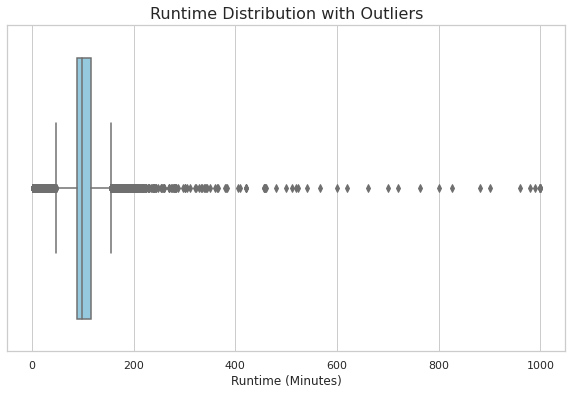

In [0]:
# Whiskers plot to visualize typical runtime and outliers
runtime_pd = df.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=runtime_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution with Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

Without outliers:

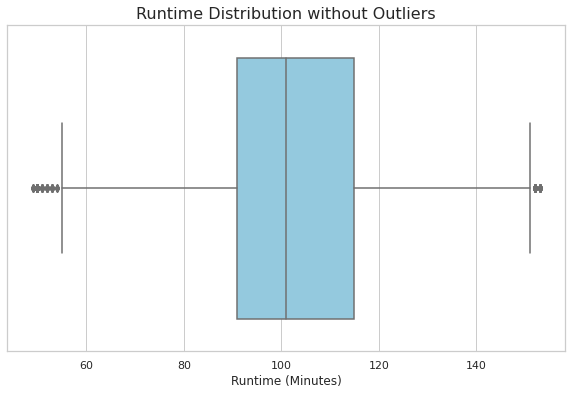

In [0]:
# Convert to pandas DataFrame
df_no_outliers_pd = df_no_outliers.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_no_outliers_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution without Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

## ADULT

In [0]:
# Check distinct values in the "adult" column and count their occurrences
distinct_adult = df.groupBy("adult").count()

# Get the number of distinct values in the "adult" column
distinct_adult_count = distinct_adult.count()
print(f"Number of distinct values in 'adult': {distinct_adult_count}")

# Display the distinct values along with their counts
display(distinct_adult)

Number of distinct values in 'adult': 2


adult,count
true,221
false,20442


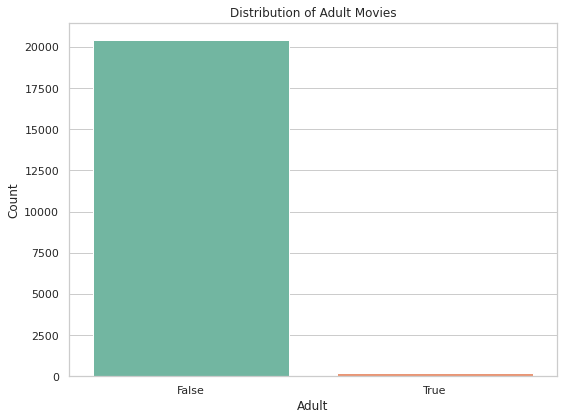

In [0]:
# Plot distribution of 'adult' values

# Count occurrences of each distinct value in 'adult' column
adult_distribution = df.groupBy("adult").count().toPandas()

# Plot the distribution
plt.figure(figsize=(8, 6))
sns.barplot(x='adult', y='count', data=adult_distribution, palette='Set2')
plt.title('Distribution of Adult Movies')
plt.xlabel('Adult')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

Overwhelming majority of the movies is **not** for adults only

## ORIGINAL LANGUAGE and ORIGINAL TITLE

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for original_language and original_title
for cname in ["original_language", "original_title"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == "0").count()

    print(
        f"{cname}: nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zero values={zeros}"
    )


original_language: nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=0
original_title: nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count()

# Sort and get the top 20 languages
top_20_languages = language_counts.orderBy(col("count").desc()).limit(20)

# Show the count of movies in the top 20 languages
top_20_languages.show()

+-----------------+-----+
|original_language|count|
+-----------------+-----+
|               en|13497|
|               es|  950|
|               fr|  730|
|               zh|  553|
|               ru|  490|
|               ja|  490|
|               hi|  439|
|               pt|  417|
|               it|  325|
|               de|  321|
|               tr|  292|
|               ko|  264|
|               cn|  181|
|               ar|  159|
|               ml|  153|
|               fa|  137|
|               ta|  130|
|               nl|   94|
|               sv|   86|
|               te|   80|
+-----------------+-----+



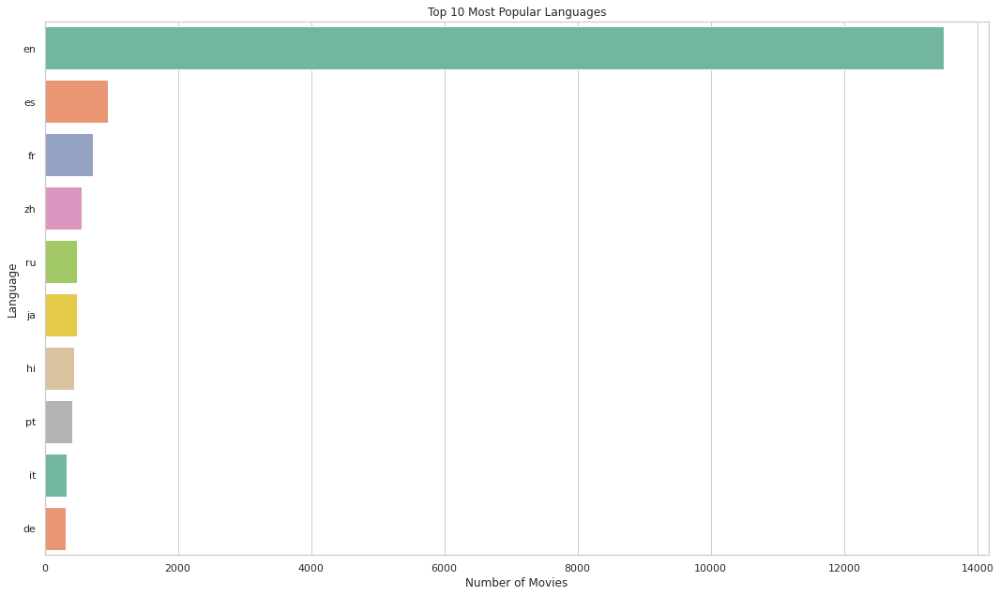

In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count().orderBy(col("count").desc())

# Show top 5 languages by count
top_languages = language_counts.limit(10).toPandas()

# Plot top 5 languages
plt.figure(figsize=(15, 9))
sns.barplot(x="count", y="original_language", data=top_languages, palette="Set2")
plt.title('Top 10 Most Popular Languages')
plt.xlabel('Number of Movies')
plt.ylabel('Language')
plt.tight_layout()
plt.show()

Great majority of the movies was filmed in english as the original language.

In [0]:
# Count the total number of rows
total_rows = df.count()

# Count the number of rows where the original_title is different from title
different_titles_count = df.filter(col("original_title") != col("title")).count()

# Calculate the percentage of rows where original_title is different from title
percentage_different_titles = (different_titles_count / total_rows) * 100

print(f"Total rows: {total_rows}")
print(f"Number of movies with different 'original_title' than 'title': {different_titles_count}")
print(f"Percentage of movies with different titles: {percentage_different_titles:.2f}%")

Total rows: 20663
Number of movies with different 'original_title' than 'title': 4798
Percentage of movies with different titles: 23.22%


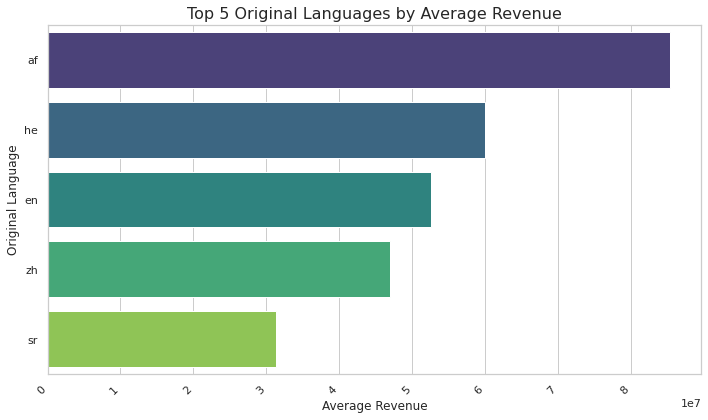

In [0]:
# Group by original_language and calculate the average revenue
language_revenue_avg = df.groupBy("original_language") \
    .agg(F.avg("revenue").alias("average_revenue"))

# Sort the languages by average revenue in descending order
language_revenue_avg = language_revenue_avg.orderBy(col("average_revenue").desc()).limit(5)

# Convert to Pandas for visualization
language_revenue_avg_pd = language_revenue_avg.toPandas()

# 4) Create a pretty bar plot
plt.figure(figsize=(10, 6))
sns.barplot(
    x="average_revenue", 
    y="original_language", 
    data=language_revenue_avg_pd, 
    palette="viridis"  # Color palette
)

# Add titles and labels for clarity
plt.title('Top 5 Original Languages by Average Revenue', fontsize=16)
plt.xlabel('Average Revenue', fontsize=12)
plt.ylabel('Original Language', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


The listed short forms of languages refer to:
- **tn**: Tswana
- **zh**: Chinese
- **ko**: Korean
- **hi**: Hindi

https://www.science.co.il/language/Codes.php

## OVERVIEW

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'overview' column
total = df.count()

nulls   = df.filter(col("overview").isNull()).count()
empties = df.filter((col("overview") == "") | (col("overview") == " ")).count()
nones   = df.filter(col("overview").isin("None", "none")).count()
zeros   = df.filter(col("overview") == "0").count()

print(f"overview: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

overview: total=20663, nulls=1678, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Set those empty or whitespace-only overviews to null
df = df.withColumn(
    "overview",
    when(trim(col("overview")) == "", None).otherwise(col("overview"))
)

# Then check again how many empty strings there are
empties = df.filter((col("overview") == "") |(col("overview") == " ")).count()
print(f"Number of empty strings left: {empties}")

Number of empty strings left: 0


In [0]:
# Add a column with the length of each overview
df_length = df.withColumn("overview_length", length(col("overview")))

# Compute min, max, avg, and median of overview_length
stats = (
    df_length
    .agg(
        F.min("overview_length").alias("min_length"),
        F.max("overview_length").alias("max_length"),
        F.avg("overview_length").alias("avg_length"),
        F.expr("percentile_approx(overview_length, 0.5)").alias("median_length")
    )
    .collect()[0]
)

min_length    = stats["min_length"]
max_length    = stats["max_length"]
avg_length    = stats["avg_length"]
median_length = stats["median_length"]

print(f"Shortest overview length: {min_length}")
print(f"Longest overview length : {max_length}")
print(f"Average overview length : {avg_length:.1f}")
print(f"Median overview length  : {median_length}")

# Show examples of the shortest and longest overviews
print("Examples of shortest overviews:")
display(
    df_length
      .filter(col("overview_length") == min_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)

print("Examples of longest overviews:")
display(
    df_length
      .filter(col("overview_length") == max_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)


Shortest overview length: 1
Longest overview length : 998
Average overview length : 274.5
Median overview length  : 235
Examples of shortest overviews:


id,title,overview,overview_length
1371237,b,x,1


Examples of longest overviews:


id,title,overview,overview_length
476292,Maquia: When the Promised Flower Blooms,"Maquia is a member of a special race called the Iorph who can live for hundreds of years. However, Maquia has always felt lonely despite being surrounded by her people, as she was orphaned from a young age. She daydreams about the outside world, but dares not travel from her home due to the warnings of the clan's chief. One day the kingdom of Mezarte invades her homeland. They already have what is left of the giant dragons, the Renato, under their control, and now their king wishes to add the immortality to his bloodline. They ravage the Iorph homeland and kill most of its inhabitants. Caught in the midst of the attack, Maquia is carried off by one of the Renato. It soon dies, and she is left deserted in a forest, now truly alone save for the cries of a single baby off in the distance. Maquia finds the baby in a destroyed village and decides to raise him as her own, naming him Ariel. Although she knows nothing of the human world, how to raise a child that ages much faster than her.",998


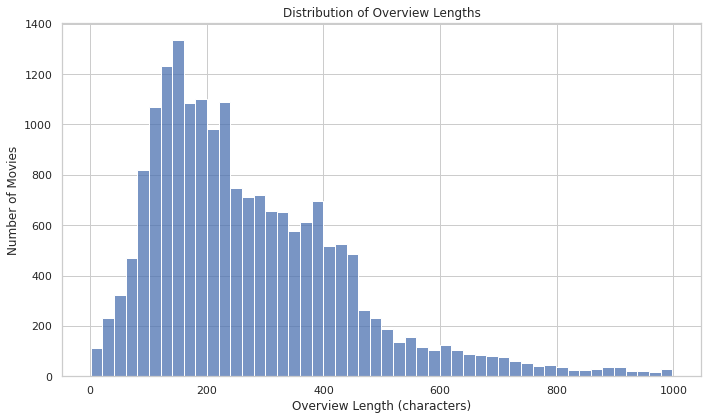

In [0]:
# Plot the distribution of overview lengths
overview_lengths_pd = df_length.select("overview_length").toPandas()

plt.figure(figsize=(10, 6))
sns.histplot(overview_lengths_pd["overview_length"], bins=50, kde=False)
plt.title("Distribution of Overview Lengths")
plt.xlabel("Overview Length (characters)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()

Distribution of overview leghts is right skewed. It indicates that most overviews have around 150 words. Only some have the maximum number of 1000 characters.

In [0]:
df = df.drop("overview_length")

## POPULARITY

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'popularity' column
total = df.count()

nulls   = df.filter(col("popularity").isNull()).count()
empties = df.filter((col("popularity") == "") |(col("popularity") == " ")).count()
nones   = df.filter(col("popularity").isin("None", "none")).count()
zeros   = df.filter(col("popularity") == "0").count()

print(f"popularity: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

popularity: total=20663, nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=1237


In [0]:
# Cast the datatype of popularity to double
df = df.withColumn("popularity", col("popularity").cast("double"))

# Print the schema to check if it worked
df.select("popularity").printSchema()

root
 |-- popularity: double (nullable = true)



Can **popularity** be zero? Let's display some examples of rows with **popularity** = 0:

In [0]:
# Count how many movies have popularity == 0
zero_pop_count = df.filter(col("popularity") == 0).count()
print(f"Number of movies with popularity = 0: {zero_pop_count}")

# Display some examples of movies with popularity == 0 
display(
    df
    .filter(col("popularity") == 0)
    .limit(10)
)

Number of movies with popularity = 0: 1237


id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
1278930,Corpus Peccati,null,0,Released,35,null,false,3,tt11697356,en,Corpus Peccati,null,0.0,null,null,null,null,null,null,null,null
1225462,Rapid Eye Movement (REM),null,0,Released,20000,15,true,14250,tt12165422,fa,Rapid Eye Movement (REM),"Varka, a babysitter has to take care of a child while needing to look after his father.",0.0,"Varka, a babysitter has to take care of a child while needing to look after his father.",Fantasy,null,Iran,Persian,"short film, amirhossein afchangi",6/8/2020,2020-06-08
1319036,Snehithulu,9.0,1,Released,10000,129,false,10000,tt13475870,en,Snehithulu,Story about friendship and love,0.0,null,null,null,null,null,null,null,null
1220872,Bukan Arwah Madhya,null,0,Released,2000,24,false,8000,tt14597486,id,Bukan Arwah Madhya,Bukan Arwah Madhya is horror short movie,0.0,By Watch The World,"Horror, Mystery","Orbisflix, Orbisflix","Indonesia, Malaysia","English, Indonesian, Malay","house, horror, mystery",9/2/2019,2019-09-02
1210123,Star Wars: The Equilibrium Knight,null,0,Released,452,16,false,500,tt14927428,en,Star Wars: The Equilibrium Knight,"Benja Naberrie, a Jedi knight in hiding is greeted by his mentor Adobe-Lan Kenobi who tells him he needs to get off his lazy ass and fight the galactic empire.",0.0,I don't know what the f*** you mean?,"Adventure, Science Fiction",Elephant Tree Productions,null,null,null,3/31/2021,2021-03-31
1209445,Jesus Christ! He's Sectioned 2 Much!,null,0,Released,83,null,false,120,tt15311404,en,Jesus Christ! He's Sectioned 2 Much!,null,0.0,null,null,null,null,null,null,null,null
1218741,Seni chorlagan vaqt,null,0,Released,10,null,true,10,tt15567174,uz,Seni chorlagan vaqt,null,0.0,null,null,null,null,null,null,null,null
1309246,Sugar,null,0,Released,17,1,false,25,tt18764684,en,Sugar,Sponsored Cast & crew IMDbPro Sugar Movie 2022 1h 30m IMDb RATING YOUR RATING Giselle Martin and Cynthia Belcher in Sugar Movie (2022) A fictional story based on true events about an empowering successful female boutique owner by day and vigilante by night who helps domestic violence victims. Her worlds are colliding and she has to overcome her protagonist plot to kidnap her daughter. Will she prevail? A fictional story based on true events about an empowering successful female boutique owner by day and vigilante by night who helps domestic violence victims. Her worlds are colliding and she has to overcome her protagonist plot to kidnap her daughter. Will she prevail?,0.0,Drama,null,null,null,null,null,null,null
1221664,Amberes,null,0,Released,6000,27,false,4500,tt2194914,en,Amberes,"Two best friends, unemployed and with time to kill. They meet up in Antwerp where they decide to each walk an opposite direction and follow the Belgian border until they meet up with a bag full of stories.",0.0,"Two bed friends, exploring the borders of their relationship",null,null,null,null,null,null,null
1197452,The Black Void,null,0,Released,6600,5,true,3700,tt23848282,ar,The Black Void,"When The Yourth goes for drugs they will by out of the sociality , But Some of them dose not going to the fallen",0.0,The Guys has not fallen in drugs,"Crime, Drama, Thriller, Horror","P.M.F Directorate of Media, HK Post Production",Iraq,Arabic,"drugs, the black void",1/1/2022,2022-01-01


In [0]:
# Calculate summary statistics for popularity
stats = df.agg(
    F.min("popularity").alias("min_popularity"),
    F.expr("percentile_approx(popularity, 0.5)").alias("median_popularity"),
    F.avg("popularity").alias("average_popularity"),
    F.max("popularity").alias("max_popularity")
).collect()[0]

print(f"Min popularity     : {stats['min_popularity']}")
print(f"Median popularity  : {stats['median_popularity']}")
print(f"Average popularity : {stats['average_popularity']:.2f}")
print(f"Max popularity     : {stats['max_popularity']}")

Min popularity     : 0.0
Median popularity  : 6.294
Average popularity : 11.88
Max popularity     : 2994.357


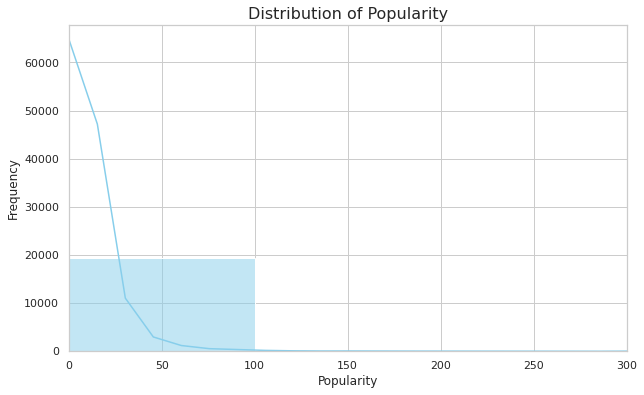

In [0]:
# Filter Spark DataFrame
pop_filtered = df.filter(df['popularity'] > 0)

# Convert to Pandas
pop_filtered_pd = pop_filtered.select('popularity').toPandas()

# Plot
plt.figure(figsize=(10, 6))
sns.histplot(pop_filtered_pd['popularity'], kde=True, color='skyblue', bins=30)

plt.xlim(0, 300)
plt.title("Distribution of Popularity", fontsize=16)
plt.xlabel("Popularity", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.show()

## TAGLINE

The column **tagline** has the correct data type - string. Let's investigate this feature:

In [0]:
# Summary for 'tagline'
total = df.count()

nulls   = df.filter(col("tagline").isNull()).count()
empties = df.filter((col("tagline") == "") | (col("tagline") == " ")).count()
nones   = df.filter(col("tagline").isin("None", "none")).count()
zeros   = df.filter(col("tagline") == "0").count()

print(f"tagline: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

tagline: total=20663, nulls=7308, empty strings=0, 'None'/'none' strings=1, zero values=0


In [0]:
# Replace "None"/"none" in `tagline` with null
from pyspark.sql.functions import when, col

# Count before replacement
none_count = df.filter(col("tagline").isin("None", "none")).count()
print(f"Taglines with 'None' or 'none' before cleanup: {none_count}")

# Perform replacement
df = df.withColumn(
    "tagline",
    when(col("tagline").isin("None", "none"), None).otherwise(col("tagline"))
)

# Verify post-replacement
post_none_count = df.filter(col("tagline").isNull()).count()
print(f"Taglines null after cleanup: {post_none_count}")

Taglines with 'None' or 'none' before cleanup: 1
Taglines null after cleanup: 7309


In [0]:
# Compute min, max, average, and median lengths of `tagline`
from pyspark.sql.functions import length, avg, expr, min as spark_min, max as spark_max

df_length = df.withColumn("tagline_length", length(col("tagline")))

stats = df_length.agg(
    spark_min("tagline_length").alias("min_length"),
    spark_max("tagline_length").alias("max_length"),
    avg("tagline_length").alias("avg_length"),
    expr("percentile_approx(tagline_length, 0.5)").alias("median_length")
).collect()[0]

print(f"Shortest tagline: {stats['min_length']}")
print(f"Longest  tagline: {stats['max_length']}")
print(f"Average  tagline: {stats['avg_length']:.1f}")
print(f"Median   tagline: {stats['median_length']}")

Shortest tagline: 1
Longest  tagline: 248
Average  tagline: 41.9
Median   tagline: 35


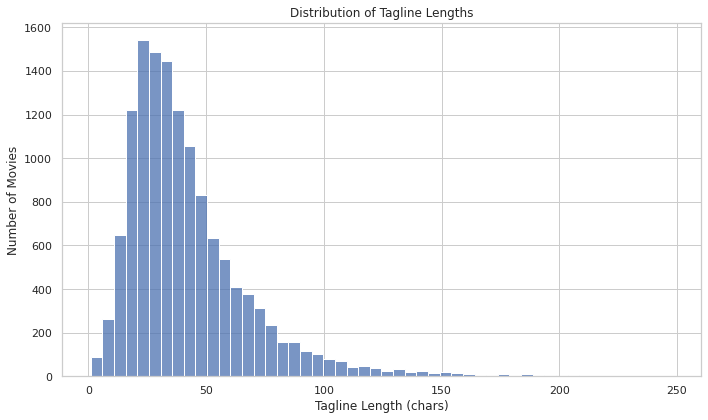

In [0]:
# Plot distribution of tagline lengths
# Convert to Pandas
lengths_pd = df_length.select("tagline_length").toPandas()["tagline_length"].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(lengths_pd, bins=50, kde=False)
plt.title("Distribution of Tagline Lengths")
plt.xlabel("Tagline Length (chars)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()


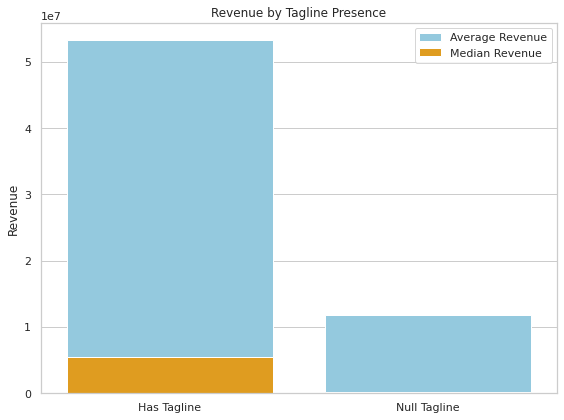

In [0]:
# Compare average revenue: tagline NULL vs non-NULL
# Compute stats
rev_stats = (
    df.groupBy(col("tagline").isNull().alias("tagline_null"))
      .agg(
          F.avg("revenue").alias("avg_revenue"),
          F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
      )
      .orderBy("tagline_null")
      .toPandas()
)

# Map boolean to labels
rev_stats["tagline_null"] = rev_stats["tagline_null"].map({True: "Null Tagline", False: "Has Tagline"})

plt.figure(figsize=(8, 6))
sns.barplot(x="tagline_null", y="avg_revenue", data=rev_stats, color="skyblue", label="Average Revenue", ci=None)
sns.barplot(x="tagline_null", y="median_revenue", data=rev_stats, color="orange", label="Median Revenue", ci=None)
plt.title("Revenue by Tagline Presence")
plt.xlabel("")
plt.ylabel("Revenue")
plt.legend()
plt.tight_layout()
plt.show()

## GENRES

Currently **genres** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'genres'
total = df.count()

nulls   = df.filter(col("genres").isNull()).count()
empties = df.filter((col("genres") == "") | (col("genres") == " ")).count()
nones   = df.filter(col("genres").isin("None", "none")).count()
zeros   = df.filter(col("genres") == "0").count()

print(f"genres: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

genres: total=20663, nulls=1942, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Cast "genres" from string to array<string> (split on ", ")
df = df.withColumn("genres_array", split(col("genres"), ",\\s*"))
df.select("genres", "genres_array").show(50, truncate=False)

+---------------------------------+-----------------------------------+
|genres                           |genres_array                       |
+---------------------------------+-----------------------------------+
|Romance, Western                 |[Romance, Western]                 |
|Drama                            |[Drama]                            |
|Fantasy, Drama                   |[Fantasy, Drama]                   |
|Fantasy, Animation               |[Fantasy, Animation]               |
|Drama, Romance                   |[Drama, Romance]                   |
|Comedy, Drama                    |[Comedy, Drama]                    |
|Drama, Thriller                  |[Drama, Thriller]                  |
|Romance, Adventure, Fantasy      |[Romance, Adventure, Fantasy]      |
|Drama, History, War              |[Drama, History, War]              |
|null                             |null                               |
|Western                          |[Western]                    

In [0]:
# Count occurrences of each distinct genre
genre_counts = (
    df
    .select(explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .count()
    .orderBy(col("count").desc())
)

display(genre_counts)

genre,count
Drama,8702
Comedy,6400
Action,3765
Thriller,3711
Romance,3180
Adventure,2397
Crime,2310
Horror,2104
Family,1611
Fantasy,1451


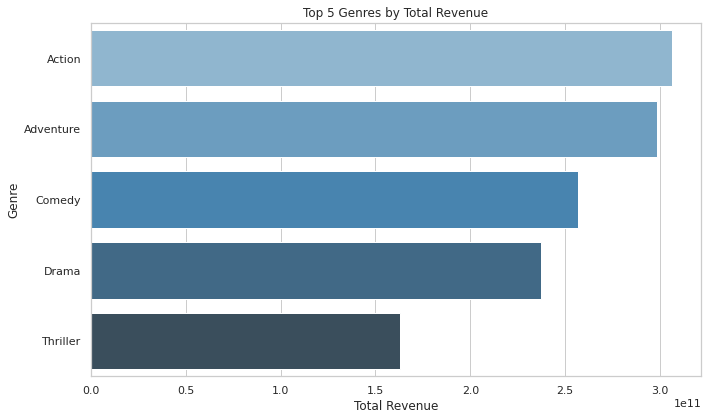

In [0]:
# Plot top 5 genres by total revenue

top5_revenue = (
    df
    .select(col("revenue"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("revenue").alias("total_revenue"))
    .orderBy(col("total_revenue").desc())
    .limit(5)
    .toPandas()
)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_revenue",
    y="genre",
    data=top5_revenue,
    palette="Blues_d"
)
plt.title("Top 5 Genres by Total Revenue")
plt.xlabel("Total Revenue")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

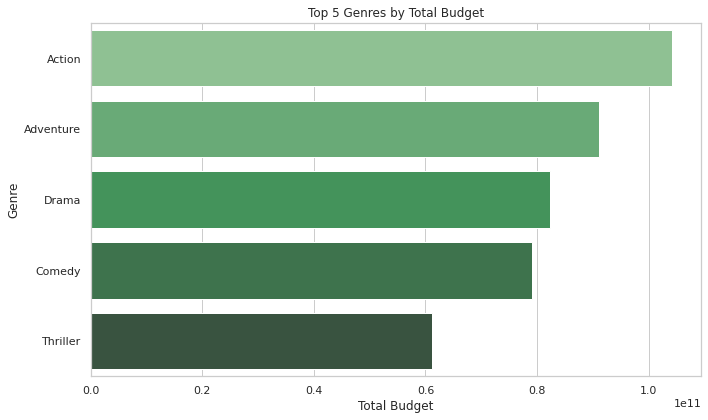

In [0]:
# Plot top 5 genres by total budget
top5_budget = (
    df
    .select(col("budget"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("budget").alias("total_budget"))
    .orderBy(col("total_budget").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_budget",
    y="genre",
    data=top5_budget,
    palette="Greens_d"
)
plt.title("Top 5 Genres by Total Budget")
plt.xlabel("Total Budget")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()


In [0]:
# Overwrite "genres" with the array column
df = df.withColumn("genres", col("genres_array"))

# Drop the helper "genres_array" column
df = df.drop("genres_array")

# Verify the change
df.select("genres").printSchema()


root
 |-- genres: array (nullable = true)
 |    |-- element: string (containsNull = false)



## PRODUCTION COMPANIES

Currently **production_companies** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'production_companies'
total = df.count()

nulls   = df.filter(col("production_companies").isNull()).count()
empties = df.filter((col("production_companies") == "") | (col("production_companies") == " ")).count()
nones   = df.filter(col("production_companies").isin("None", "none")).count()
zeros   = df.filter(col("production_companies") == "0").count()

print(f"production_companies: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

production_companies: total=20663, nulls=3728, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Cast `production_companies` from string to array<string>
df = df.withColumn(
    "production_companies",
    split(col("production_companies"), ",\\s*")
)
df.select("production_companies").printSchema()

root
 |-- production_companies: array (nullable = true)
 |    |-- element: string (containsNull = false)



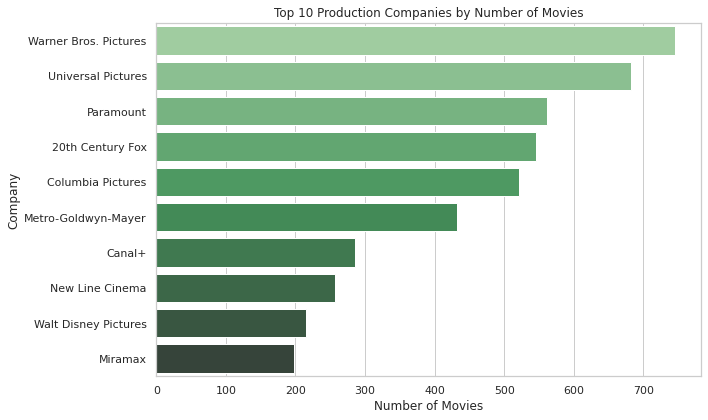

In [0]:
# Top 10 production_companies by number of movies
company_counts = (
    df
    .select(explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .count()
    .orderBy(col("count").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="count", y="company", data=company_counts, palette="Greens_d")
plt.title("Top 10 Production Companies by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


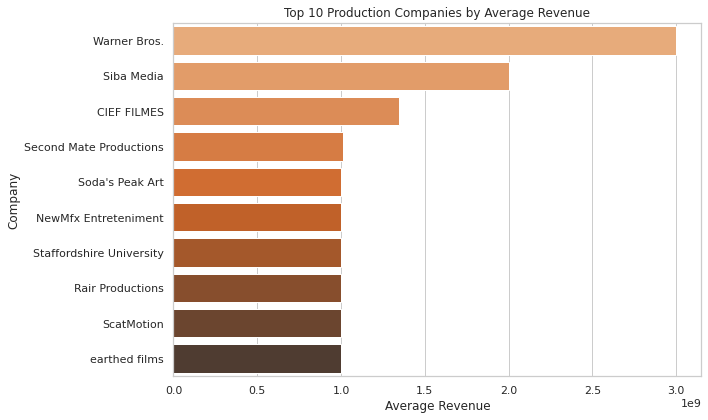

In [0]:
# 3) Top 10 production_companies by average revenue

company_revenue = (
    df
    .select(col("revenue"), explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="company", data=company_revenue, palette="Oranges_d")
plt.title("Top 10 Production Companies by Average Revenue")
plt.xlabel("Average Revenue")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


## PRODUCTION COUNTRIES

Currently **production_countries** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'production_countries'
total = df.count()

nulls   = df.filter(col("production_countries").isNull()).count()
empties = df.filter((col("production_countries") == "") | (col("production_countries") == " ")).count()
nones   = df.filter(col("production_countries").isin("None", "none")).count()
zeros   = df.filter(col("production_countries") == "0").count()

print(f"production_countries: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

production_countries: total=20663, nulls=3289, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Cast `production_countries` from string to array<string>
df = df.withColumn(
    "production_countries",
    split(col("production_countries"), ",\\s*")
)
df.select("production_countries").printSchema()

root
 |-- production_countries: array (nullable = true)
 |    |-- element: string (containsNull = false)



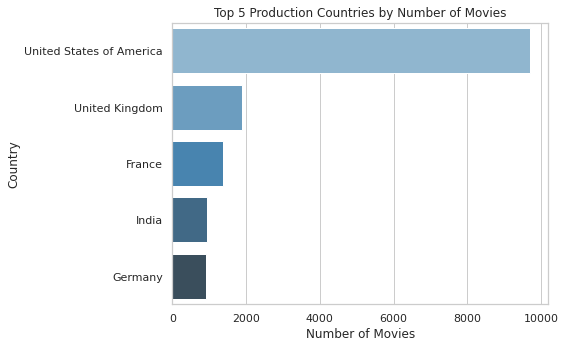

In [0]:
# Top 5 production_countries by number of movies

country_counts = (
    df
    .select(explode(col("production_countries")).alias("country"))
    .groupBy("country")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="country", data=country_counts, palette="Blues_d")
plt.title("Top 5 Production Countries by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

## SPOKEN LANGUAGES

- Currently **spoken_languages** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'spoken_languages'
total = df.count()

nulls   = df.filter(col("spoken_languages").isNull()).count()
empties = df.filter((col("spoken_languages") == "") | (col("spoken_languages") == " ")).count()
nones   = df.filter(col("spoken_languages").isin("None", "none")).count()
zeros   = df.filter(col("spoken_languages") == "0").count()

print(f"spoken_languages: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

spoken_languages: total=20663, nulls=2676, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Cast `spoken_languages` from string to array<string>
df = df.withColumn(
    "spoken_languages",
    split(col("spoken_languages"), ",\\s*")
)
df.select("spoken_languages").printSchema()


root
 |-- spoken_languages: array (nullable = true)
 |    |-- element: string (containsNull = false)



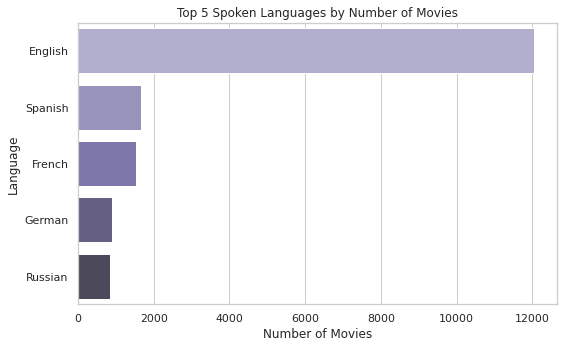

In [0]:
# Top 5 spoken_languages by number of movies
lang_counts = (
    df
    .select(explode(col("spoken_languages")).alias("language"))
    .groupBy("language")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="language", data=lang_counts, palette="Purples_d")
plt.title("Top 5 Spoken Languages by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

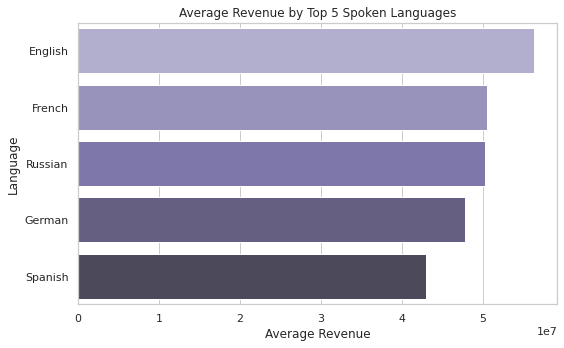

In [0]:
# Average revenue per top 5 spoken_languages
top5_langs = lang_counts["language"].tolist()
avg_rev_lang = (
    df
    .select(col("revenue"), explode(col("spoken_languages")).alias("language"))
    .filter(col("language").isin(top5_langs))
    .groupBy("language")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="avg_revenue", y="language", data=avg_rev_lang, palette="Purples_d")
plt.title("Average Revenue by Top 5 Spoken Languages")
plt.xlabel("Average Revenue")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

## KEYWORDS

- Currently **keywords** is in type string. We want to cast it to an array.

In [0]:
# Summary for 'keywords'
total = df.count()

nulls   = df.filter(col("keywords").isNull()).count()
empties = df.filter((col("keywords") == "") | (col("keywords") == " ")).count()
nones   = df.filter(col("keywords").isin("None", "none")).count()
zeros   = df.filter(col("keywords") == "0").count()

print(f"keywords: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

keywords: total=20663, nulls=5652, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Cast `keywords` from string to array<string>
df = df.withColumn(
    "keywords",
    split(col("keywords"), ",\\s*")
)
df.select("keywords").printSchema()


root
 |-- keywords: array (nullable = true)
 |    |-- element: string (containsNull = false)



In [0]:
# Top 50 keywords by frequency

keyword_counts = (
    df
    .select(explode(col("keywords")).alias("keyword"))
    .groupBy("keyword")
    .count()
    .orderBy(col("count").desc())
    .limit(50)
    .toPandas()
)

print("Top 50 Keywords by Frequency:")
display(keyword_counts)


Top 50 Keywords by Frequency:


keyword,count
based on novel or book,1199
woman director,904
murder,719
new york city,634
california,501
based on true story,470
duringcreditsstinger,466
revenge,462
sequel,452
biography,411


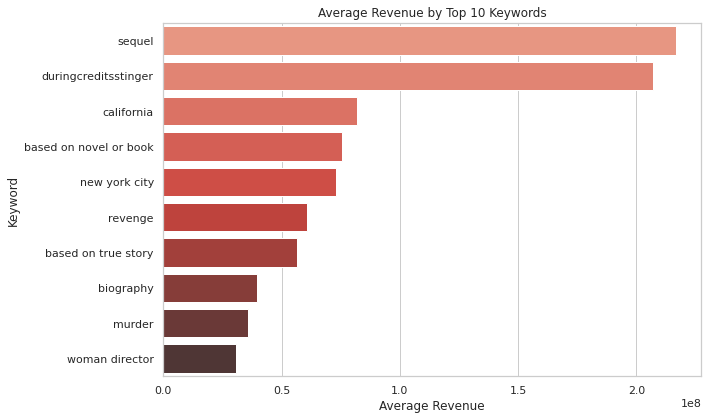

In [0]:
# Average revenue per top 10 keywords
top10_keywords = keyword_counts["keyword"].tolist()[:10]
avg_rev_kw = (
    df
    .select(col("revenue"), explode(col("keywords")).alias("keyword"))
    .filter(col("keyword").isin(top10_keywords))
    .groupBy("keyword")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="keyword", data=avg_rev_kw, palette="Reds_d")
plt.title("Average Revenue by Top 10 Keywords")
plt.xlabel("Average Revenue")
plt.ylabel("Keyword")
plt.tight_layout()
plt.show()


###Create Profit and ROI to enhance our analysis

In [0]:
# Filter out rows with zero or null budget or revenue to avoid division errors
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Create 'profit' and 'roi' columns
df_money = df_money.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

In [0]:
# Describe the statistics for 'profit' and 'roi' columns in PySpark
df_money.describe(['profit', 'roi']).show()


+-------+--------------------+--------------------+
|summary|              profit|                 roi|
+-------+--------------------+--------------------+
|  count|               14157|               14157|
|   mean|         3.4662871E7|  361306.13240510557|
| stddev|1.3550017759311926E8|1.5585918442675523E7|
|    min|          -899999984|4.444444444444444E-9|
|    max|          4999999899|               1.0E9|
+-------+--------------------+--------------------+



###Check only de ROI > 0

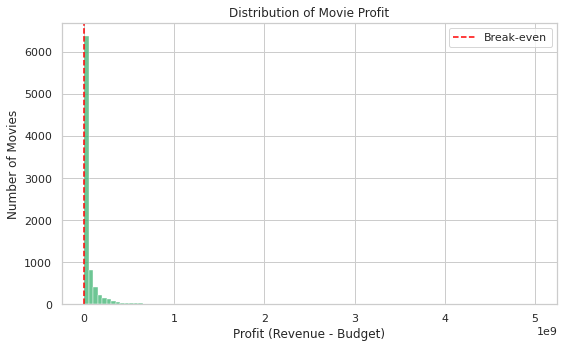

In [0]:
# Step 1: Calculate profit and ROI
df_money = df.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

# Step 2: Filter for positive profit and ROI
profit_roi_filtered = df_money.filter((col('profit') > 0) & (col('roi') > 0))

# Step 3: Convert to pandas DataFrame for plotting
profit_roi_filtered_pd = profit_roi_filtered.select('profit').toPandas()

# Step 4: Plot the distribution of profit
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.histplot(profit_roi_filtered_pd['profit'], bins=100, color='mediumseagreen')
plt.title('Distribution of Movie Profit')
plt.xlabel('Profit (Revenue - Budget)')
plt.ylabel('Number of Movies')
plt.axvline(0, color='red', linestyle='--', label='Break-even')
plt.legend()
plt.tight_layout()
plt.show()

###Movies with the highest profit

In [0]:
# Step 1: Sort by profit in descending order and get the top 10 movies
top_profit = profit_roi_filtered.orderBy(col('profit'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, revenue, budget, profit)
top_profit_selected = top_profit.select('title', 'revenue', 'budget', 'profit')

# Step 3: Convert to pandas DataFrame to display in a table
top_profit_selected_pd = top_profit_selected.toPandas()

# Step 4: Display the result
print(top_profit_selected_pd)

                          title     revenue     budget      profit
0             babben: the movie  4999999999        100  4999999899
1                     Bee Movie  2930000000  150000000  2780000000
2             TikTok Rizz Party  3000000000  250000000  2750000000
3                        Avatar  2923706026  237000000  2686706026
4             Avengers: Endgame  2800000000  356000000  2444000000
5       Adventures in Bora Bora  3000000000  800000000  2200000000
6                       Titanic  2264162353  200000000  2064162353
7                   Best Of Joy  2000000000       1000  1999999000
8      Avatar: The Way of Water  2320250281  460000000  1860250281
9  Star Wars: The Force Awakens  2068223624  245000000  1823223624


###Movies with the highest ROI

In [0]:
# Step 1: Sort by ROI in descending order and get the top 10 movies
top_roi = profit_roi_filtered.orderBy(col('roi'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, budget, revenue, roi)
top_roi_selected = top_roi.select('title', 'budget', 'revenue', 'roi')

# Step 3: Convert to pandas DataFrame to display in a table
top_roi_selected_pd = top_roi_selected.toPandas()

# Step 4: Display the result
print(top_roi_selected_pd)


                              title  budget     revenue           roi
0                ירידתם של המגניבים       1  1000000000  1.000000e+09
1             Pouring Out The Heart       1  1000000000  1.000000e+09
2  GEESE - THE MONEY TALKS TOUR '24       1  1000000000  1.000000e+09
3                     Lil Detective       2   999999999  5.000000e+08
4                   חברים על סמים 2       5  1000000000  2.000000e+08
5                   חברים על סמים 1       5  1000000000  2.000000e+08
6                              דילן       5  1000000000  2.000000e+08
7                Żyraf: Czas Zemsty       1   100004215  1.000042e+08
8                  A Cama do Macaco      10  1000000000  1.000000e+08
9                         The Light       1   100000000  1.000000e+08


##Correlation Matrix for Popularity, Vote_Count and Revenue

In [0]:
# Convert to pandas for correlation analysis
df_pd = df.select('popularity', 'vote_count', 'revenue').toPandas()

# Compute correlation matrix
correlation_popularity = df_pd.corr()

# Display the correlation matrix
print("Correlation between Popularity, Vote Count, and Revenue:")
print(correlation_popularity)


Correlation between Popularity, Vote Count, and Revenue:
            popularity  vote_count   revenue
popularity    1.000000    0.233331  0.216469
vote_count    0.233331    1.000000  0.642685
revenue       0.216469    0.642685  1.000000


Vote count appears to have the strongest relationship with revenue.

Both popularity and vote count are positively correlated with revenue, but the relationship with popularity is weaker compared to the relationship between vote count and revenue.

# Export the dataset

In [0]:
from pyspark.sql.functions import concat_ws
# Convert all array<string> columns back into comma-separated strings
df_export = df \
  .withColumn("genres",               concat_ws(", ", col("genres"))) \
  .withColumn("production_companies", concat_ws(", ", col("production_companies"))) \
  .withColumn("production_countries", concat_ws(", ", col("production_countries"))) \
  .withColumn("spoken_languages",     concat_ws(", ", col("spoken_languages"))) \
  .withColumn("keywords",             concat_ws(", ", col("keywords")))

# Verify that genres is now a StringType
df_export.select("genres").printSchema()

root
 |-- genres: string (nullable = false)



In [0]:
# coalesce to 1 file (optional), write with header
df_export.coalesce(1) \
  .write \
  .mode("overwrite") \
  .option("header", "true") \
  .csv("/FileStore/tables/IMDB_Cleaned")

In [0]:
display(df)

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
174104,The Spoilers,6.2,3,Released,4100000,110,false,0,tt0004630,en,The Spoilers,"The Spoilers is a 1914 film directed by Colin Campbell. It is set in Nome, Alaska during the 1898 Gold Rush, with William Farnum as Roy Glennister, Kathlyn Williams as Cherry Malotte, and Tom Santschi as Alex McNamara. The film culminates in a spectacular saloon fistfight between Glennister and McNamara. It was adapted to screen by Lanier Bartlett from the Rex Beach novel of the same name.",0.6,null,"List(Romance, Western)",List(Selig Polyscope Company),List(United States of America),null,"List(alaska, silent film, nome alaska, saloon brawl, klondike gold rush, partially lost film)",4/10/1914,1914-04-10
70368,The Cheat,5.983,58,Released,137365,59,false,17311,tt0005078,en,The Cheat,"A venal, spoiled stockbroker's wife impulsively embezzles $10,000 from the charity she chairs and desperately turns to a Burmese ivory trader to replace the stolen money.",3.104,null,List(Drama),"List(Jesse L. Lasky Feature Play Company, Paramount)",List(United States of America),List(No Language),null,12/13/1915,1915-12-13
278480,A Daughter of the Gods,3.5,2,Released,1390000,180,false,1000000,tt0006568,en,A Daughter of the Gods,A sultan agrees to help an evil witch destroy a mysterious beauty if the witch will bring his young son back to life.,0.887,null,"List(Fantasy, Drama)",List(Fox Film Corporation),List(United States of America),null,null,10/16/1916,1916-10-16
132410,The Ghost of Slumber Mountain,6.0,8,Released,3000,16,false,3000,tt0009105,en,The Ghost of Slumber Mountain,"In a dream Uncle Jack looks through a magic telescope owned by the ghost of a hermit and sees what life was like millions of years ago, including a battle between prehistoric monsters.",1.116,"These giant monsters of the past are seen to breathe, to live again, to move and battle as they did at dawn of life.","List(Fantasy, Animation)",List(Herbert M. Dawley Production),List(United States of America),List(No Language),"List(stop motion, dinosaur, silent film, partially lost film)",11/17/1918,1918-11-17
899,Broken Blossoms,6.874,199,Released,2400000,89,false,0,tt0009968,en,Broken Blossoms,The love story of an abused English girl and a Chinese Buddhist in a time when London was a brutal and harsh place to live.,7.716,A Tale of Forbidden Love,"List(Drama, Romance)","List(D.W. Griffith Productions, United Artists)",List(United States of America),List(No Language),"List(suicide, london, england, china, boxer, buddhist, murder, racism, black and white, alcoholic, silent film, based on short story)",5/13/1919,1919-05-13
10098,The Kid,8.195,1874,Released,2500000,68,false,250000,tt0012349,en,The Kid,A tramp cares for a boy after he's abandoned as a newborn by his mother. Later the mother has a change of heart and aches to be reunited with her son.,11.172,6 reels of Joy.,"List(Comedy, Drama)",List(Charles Chaplin Productions),List(United States of America),List(No Language),"List(angel, suicide attempt, fistfight, slapstick comedy, black and white, class differences, foundling, silent film, dream sequence, semi autobiographical, car theft, little tramp, illegitimate child, unwed mother, abandoned baby, out of wedlock child, raised like own child, good deed doer)",1/21/1921,1921-01-21
35227,Foolish Wives,6.6,75,Released,400200,143,false,1100000,tt0013140,en,Foolish Wives,A con artist masquerades as Russian nobility and attempts to seduce the wife of an American diplomat.,5.13,null,"List(Drama, Thriller)",List(Universal Film Manufacturing Company),List(United States of America),List(No Language),"List(court, monte carlo, wig)",1/11/1922,1922-01-11
28963,The Thief of Bagdad,7.318,140,Released,1490419,149,false,1135654,tt0015400,en,The Thief of Bagdad,A recalcitrant th